<h1 style="color:#191970">La Consommation d'Energie des Appareils Electroménagers </h1>

<h3 style="color:#008B8B">Membre de groupe :</h3>
- <b>DEMRAOUI Salma </b><br>
- <b>AIT AISSA Rachid</b><br>
- <b>CHAIB Abdelfatah</b><br>

<h2 style="color: #008B8B">Objectif Principal :</h2>
<b>Ce projet vise à prédire la consommation énergétique des appareils électroménagers en utilisant des données environnementales telles que la température, l'humidité et la lumière, collectées via des capteurs intelligents (par exemple, DHT22). Face à l'augmentation des besoins énergétiques et aux impacts environnementaux associés, il est crucial de comprendre les facteurs influençant cette consommation et d'identifier des opportunités de réduction.</b>

<h2 style="color: #008B8B">Données disponibles :</h2>
1. <b>Variables explicatives :</b> 28 caractéristiques (température, humidité, pression, etc.).<br>
2. <b>Variable cible :</b> Appliances (Appareils).


<h2 style="color: #008B8B">Comprendre les variable du jeu de donnees :</h2>


| Variable      | Explication                                                                  |
|---------------|----------------------------------------------------------------------------- |
| date          | Date et heure de l'enregistrement des données                                |
| Appliances    | Consommation d'énergie des appareils électroménagers en Wh                   |
| lights        | Consommation d'énergie des lumières en Wh                                    |
| T1            | Température mesurée dans la zone 1 de la maison en degrés Celsius            |
| RH_1          | Taux d'humidité mesuré dans la zone 1 de la maison en pourcentage            |
| T2            | Température mesurée dans la zone 2 de la maison en degrés Celsius            |
| RH_2          | Taux d'humidité mesuré dans la zone 2 de la maison en pourcentage            |
| T3            | Température mesurée dans la zone 3 de la maison en degrés Celsius            |
| RH_3          | Taux d'humidité mesuré dans la zone 3 de la maison en pourcentage            |
| T4            | Température mesurée dans la zone 4 de la maison en degrés Celsius            |
| RH_4          | Taux d'humidité mesuré dans la zone 4 de la maison en pourcentage            |
| T5            | Température mesurée dans la zone 5 de la maison en degrés Celsius            |
| RH_5          | Taux d'humidité mesuré dans la zone 5 de la maison en pourcentage            |
| T6            | Température mesurée dans la zone 6 de la maison en degrés Celsius            |
| RH_6          | Taux d'humidité mesuré dans la zone 6 de la maison en pourcentage            |
| T7            | Température mesurée dans la zone 7 de la maison en degrés Celsius            |
| RH_7          | Taux d'humidité mesuré dans la zone 7 de la maison en pourcentage            |
| T8            | Température mesurée dans la zone 8 de la maison en degrés Celsius            |
| RH_8          | Taux d'humidité mesuré dans la zone 8 de la maison en pourcentage            |
| T9            | Température mesurée dans la zone 9 de la maison en degrés Celsius            |
| RH_9          | Taux d'humidité mesuré dans la zone 9 de la maison en pourcentage            |
| T_out         | Température extérieure en degrés Celsius                                      |
| Press_mm_hg   | Pression atmosphérique en mmHg                                               |
| RH_out        | Taux d'humidité extérieur en pourcentage                                      |
| Windspeed     | Vitesse du vent en m/s                                                       |
| Visibility    | Visibilité en km                                                             |
| Tdewpoint     | Point de rosée en degrés Celsius                                             |
| new_date      | Nouvelle représentation de la date (peut être une transformation ou un format différent) |

<h2 style="color: #008B8B">Regroupement des variables: </h2>

| Groupe            | Variables                                        |
|-------------------|--------------------------------------------------|
| Énergie           | Appliances                                       |
| Température       | T1, T2, T3, T4, T5, T6, T7, T8, T9        |
| Taux d'humidité   | RH_1, RH_2, RH_3, RH_4, RH_5, RH_6, RH_7, RH_8, RH_9       |
| Environnement     | Press_mm_hg, T_out, RH_out, Windspeed, Visibility, Tdewpoint    |
| Autres            | date                                      |

<h2 style="color: #008B8B">Quelles sont les étapes suiviées dans ce projet ? </h2>

1️⃣ <b>Exploration des données</b> <br>
2️⃣ <b>Visualisation des données</b><br>
3️⃣ <b>Prétraitement des données<br>
4️⃣ <b>Analyse Statistique<br>
5️⃣ <b>Modélisation des données</b>

<h2 style="color: #008B8B"> D'où viennent ces données ?</h2>

<img src="image.jpg" width=700 heghit=300>

In [14]:
# Importation des bibliothèques nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy 

# Bibliothèques pour la régression et l'évaluation
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Modèles de régression
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.ensemble import ExtraTreesRegressor

<h1 style="color:darkred">I. Exploration et Visualisation des données</h1>

<h2 style="color:green">1. Exploration :</h2>

In [17]:
#Chargement et affichage de Dataset
data=pd.read_csv('energydata.csv')
data.head(10)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.20,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.500000,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.20,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.20,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.700000,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.20,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.800000,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.20,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
5,2016-01-11 17:50:00,50,40,19.890000,46.026667,19.20,44.500000,19.79,44.933333,18.890000,...,17.000000,45.29,6.016667,734.000000,92.000000,5.333333,43.833333,4.800000,44.919484,44.919484
6,2016-01-11 18:00:00,60,50,19.890000,45.766667,19.20,44.500000,19.79,44.900000,18.890000,...,17.000000,45.29,5.900000,734.100000,92.000000,5.000000,40.000000,4.700000,47.233763,47.233763
7,2016-01-11 18:10:00,60,50,19.856667,45.560000,19.20,44.500000,19.73,44.900000,18.890000,...,17.000000,45.29,5.916667,734.166667,91.833333,5.166667,40.000000,4.683333,33.039890,33.039890
8,2016-01-11 18:20:00,60,40,19.790000,45.597500,19.20,44.433333,19.73,44.790000,18.890000,...,17.000000,45.29,5.933333,734.233333,91.666667,5.333333,40.000000,4.666667,31.455702,31.455702
9,2016-01-11 18:30:00,70,40,19.856667,46.090000,19.23,44.400000,19.79,44.863333,18.890000,...,17.000000,45.29,5.950000,734.300000,91.500000,5.500000,40.000000,4.650000,3.089314,3.089314


In [18]:
#La taille de Dataset
print('Le nombre de Colonnes :', data.shape[1])
print('Le nombre de Lignes :', data.shape[0])

Le nombre de Colonnes : 29
Le nombre de Lignes : 19735


In [19]:
#Les Données Statistiques de Dataset
data.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [20]:
#Affichage des colonnes avec les types de données
data.dtypes

date            object
Appliances       int64
lights           int64
T1             float64
RH_1           float64
T2             float64
RH_2           float64
T3             float64
RH_3           float64
T4             float64
RH_4           float64
T5             float64
RH_5           float64
T6             float64
RH_6           float64
T7             float64
RH_7           float64
T8             float64
RH_8           float64
T9             float64
RH_9           float64
T_out          float64
Press_mm_hg    float64
RH_out         float64
Windspeed      float64
Visibility     float64
Tdewpoint      float64
rv1            float64
rv2            float64
dtype: object

In [21]:
data.dtypes.value_counts()

float64    26
int64       2
object      1
Name: count, dtype: int64

<Axes: ylabel='count'>

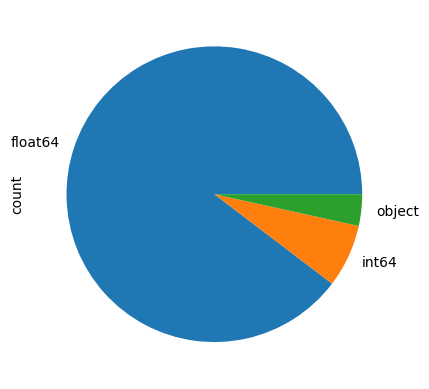

In [22]:
data.dtypes.value_counts().plot.pie()

In [23]:
# Supprimer la colonne 'date' car elle ne sera pas utilisée
data = data.drop(columns=['date'])

In [24]:
data.dtypes.value_counts()

float64    26
int64       2
Name: count, dtype: int64

In [25]:
#Vérification des Valeurs Manquantes
data.isna().sum()

Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

<Axes: >

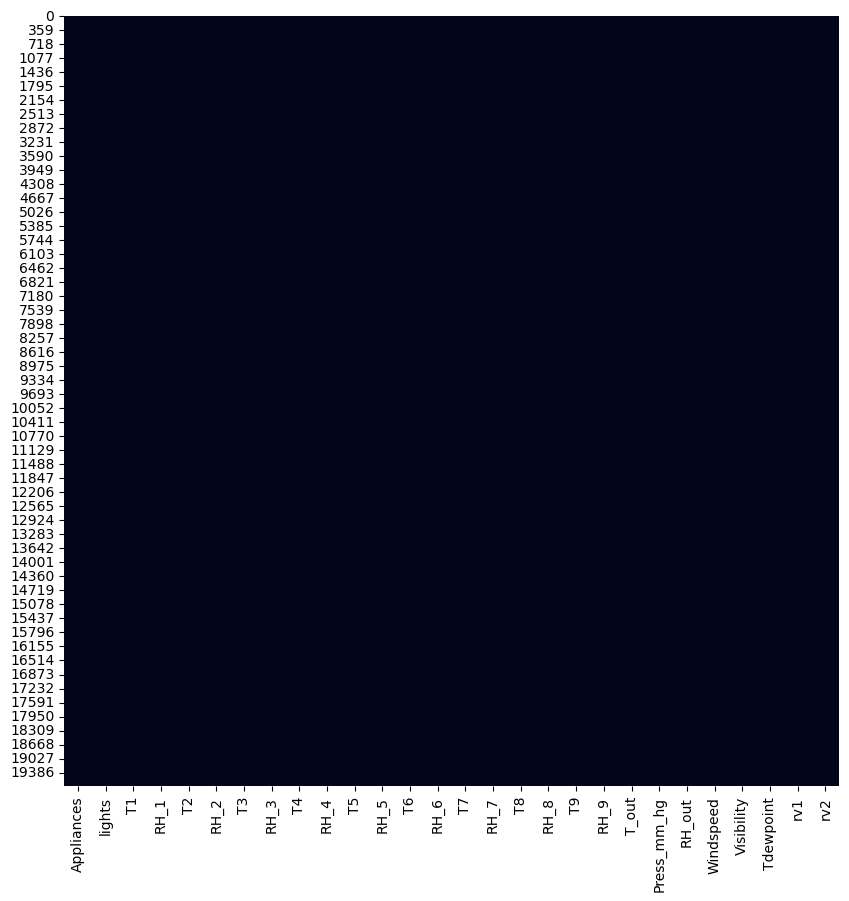

In [26]:
plt.figure(figsize=(10, 10))  
sns.heatmap(data.isna(), cbar=False) 

<p style="background-color:#FAFAD2"><b>D'après cette Heatmap, nous constatons que notre dataset est complet, aucune donnée n'est manquante. Nous pouvons passer à l'étape suivante sans nécessiter d'imputation ou la suppression de valeurs.</b></p>

<h2 style="color:green">2. Visualisation :</h2>

<h3 style="color:#228B22">a. L'histogramme de Dataset</h3>

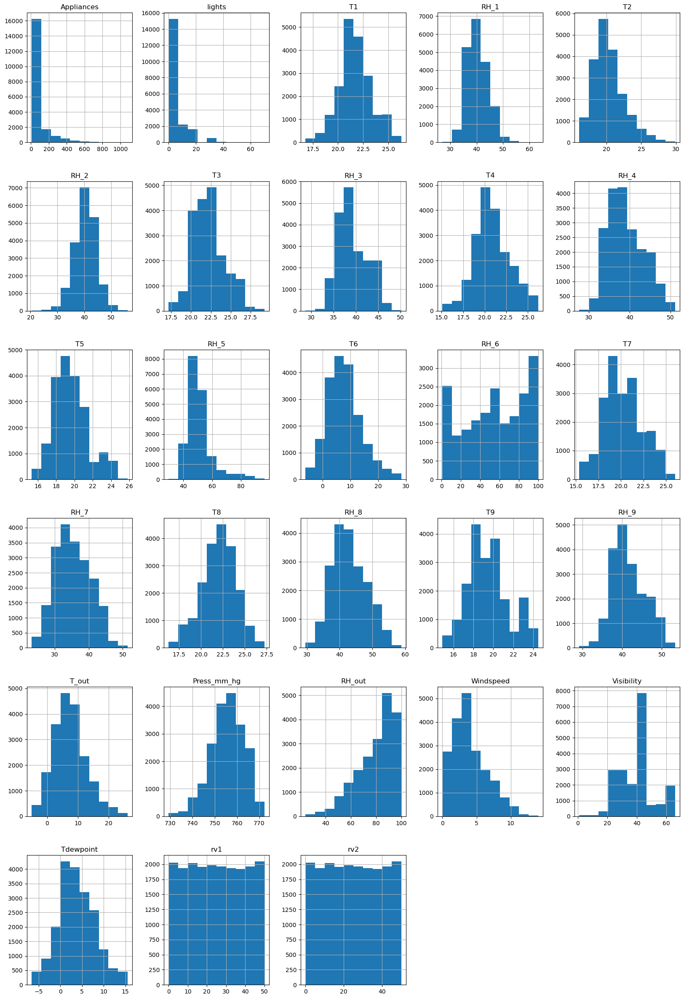

In [30]:
#Histogramme de Dataset
data.hist(figsize=(20,30))
plt.show()

<h3 style="color:#228B22">b. La distribution de Target</h3>

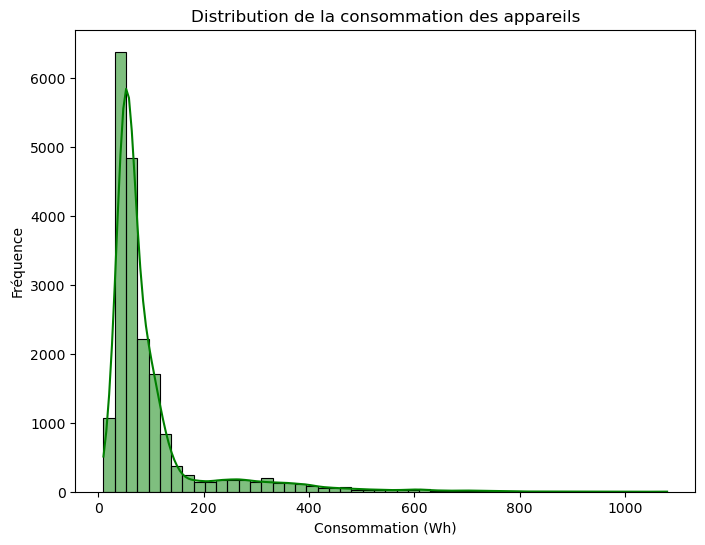

In [32]:
#La distribution de variable target 'Appliances'
plt.figure(figsize=(8, 6))
sns.histplot(data['Appliances'], bins=50, kde=True, color='green')
plt.title('Distribution de la consommation des appareils')
plt.xlabel('Consommation (Wh)')
plt.ylabel('Fréquence')
plt.show()

<h3 style="color:#2F4F4F">Interprétation de l'histogramme :</h3>
<p style="background-color:#FAFAD2">
1. La distribution est <b>asymétrique à droite</b>.<br>
2. La majorité des valeurs de consommation énergétique des appareils se situent entre <b>0</b> et <b>200 Wh</b>.<br>
3. Quelques observations ont des consommations beaucoup plus élevées (au-delà de <b>200 Wh</b>), mais elles sont rares.<br>
4. La plupart des données sont concentrées autour de <b>0</b> à <b>100 Wh</b>, avec un pic majeur près de <b>0 Wh</b>. Cela indique que dans la plupart des cas, les appareils consomment peu d'énergie.
5. On observe une longue traîne vers la droite (jusqu'à environ <b>1000 Wh</b>). Cela pourrait indiquer des cas de consommation élevée qui sont rares mais significatifs.
</p>

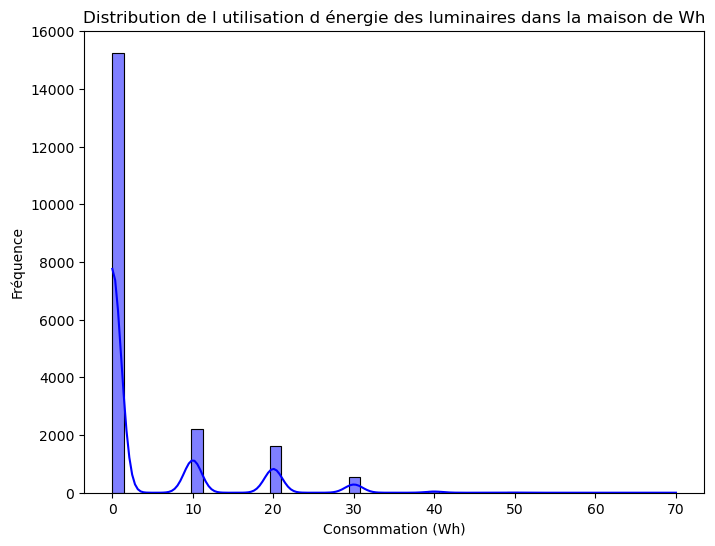

In [34]:
#La distribution de variable'lightd'
plt.figure(figsize=(8, 6))
sns.histplot(data['lights'], bins=50, kde=True, color='blue')
plt.title('Distribution de l utilisation d énergie des luminaires dans la maison de Wh')
plt.xlabel('Consommation (Wh)')
plt.ylabel('Fréquence')
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
<b>Nous remarquons qu'il y un grand nombre des valeurs nulles dans cette colonne, c-à-d n'est pas très utile et sera ignorée dans le reste du traitement.</b><br>
</p>


<h3 style="color:#228B22">c. La visualisation des Variables Numériques</h3>

In [37]:
# Sélection des variables essentielles 
essential_col = [
    'Appliances' ,
    'T1', 'T2', 'T3', 'T4' , 'T5' , 'T6' , 'T7' , 'T8' , 'T9', # Température 
    'RH_1', 'RH_2', 'RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9', # Humidité 
    'Press_mm_hg', 'T_out', 'RH_out'      # Pression et conditions extérieures
]

# Groupement des colonnes par catégorie
temp_cols = ['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9']  # Températures
humidity_cols = ['RH_1', 'RH_2', 'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9']  # Humidité
external_cols = ['Press_mm_hg', 'T_out', 'RH_out']  # Conditions extérieures

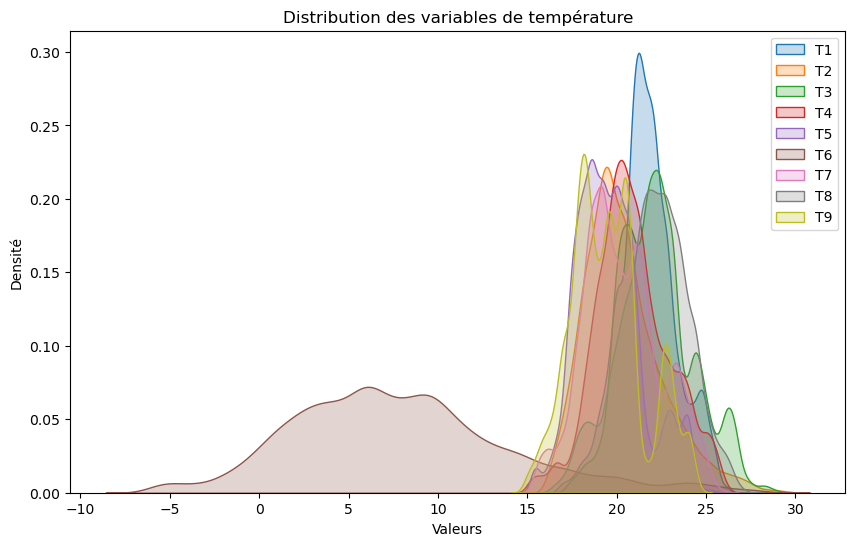

In [38]:
# Distribution du Températures
plt.figure(figsize=(10, 6))
for col in temp_cols:
    sns.kdeplot(data[col], label=col, fill=True)
plt.title('Distribution des variables de température')
plt.xlabel('Valeurs')
plt.ylabel('Densité')
plt.legend()
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
<b>A partir la visualisation de la distribution des variables du température nous constatons que :</b><br>
1. Les valeurs des températures sont principalement concentrées entre <b>15</b> et <b>25°C</b>.<br>
2. Les queues des distributions pour certaines variables (par exemple, <b>T6</b> ou <b>T3</b>) s'étendent vers des <b>valeurs extrêmes</b> négatives ou positives. Cela peut être dû à des anomalies, des erreurs de capteur, ou des événements rares.<br>
</p>

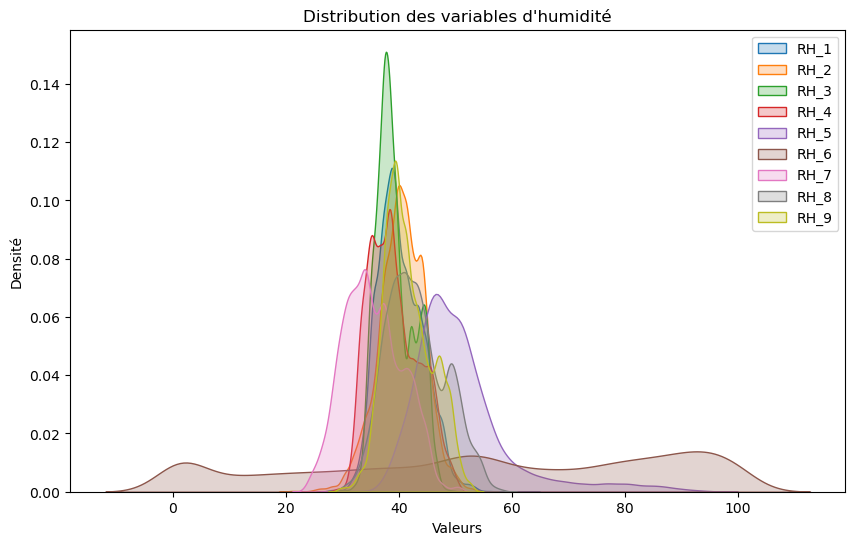

In [40]:
# Distribution du Humidité
plt.figure(figsize=(10, 6))
for col in humidity_cols:
    sns.kdeplot(data[col], label=col, fill=True)
plt.title('Distribution des variables d\'humidité')
plt.xlabel('Valeurs')
plt.ylabel('Densité')
plt.legend()
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
<b>A partir la visualisation de la distribution des variables du l'humidité nous pouvons voir que :</b><br>
1. Les valeurs des humidités sont principalement concentrées entre <b>30%</b> et <b>50%</b>. 
2. Les pics de densité indiquent une forte fréquence d'observations autour de ces valeurs pour toutes les variables d'humidité.
3. Les courbes de densité pour certaines variables (par exemple, <b>RH_5</b> et <b>RH_6</b>) s'étendent vers des <b>valeurs extrêmes</b> négatives ou positives. C'est-à-dire il y a des anomalies.
</p>

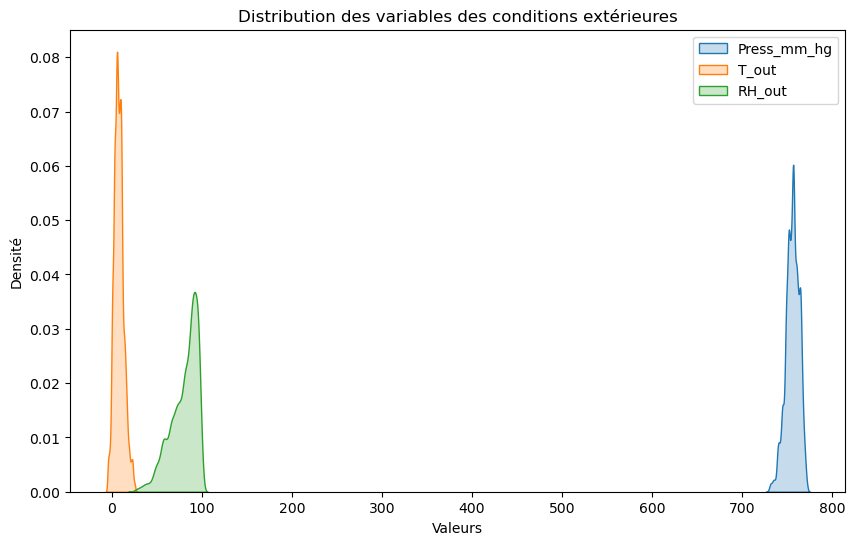

In [42]:
# Distribution du Conditions extérieures
plt.figure(figsize=(10, 6))
for col in external_cols:
    sns.kdeplot(data[col], label=col, fill=True)
plt.title('Distribution des variables des conditions extérieures')
plt.xlabel('Valeurs')
plt.ylabel('Densité')
plt.legend()
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
<b>A partir la visualisation de la distribution des variables d' extérieure nous pouvons voir que :</b><br>
1. Les valeurs des pressions atmosphériques (Press_mm_hg) sont principalement situées entre <b>750</b> et <b>800 mm Hg</b>.<br>
2. Les températures extérieures (T_out) se trouvent majoritairement entre <b>0</b> et <b>50°C</b>. <br>
3. L'humidité relative extérieure (RH_out) présente des valeurs surtout comprises entre <b>50%</b> et <b>100%</b>.<br>
4. Les extrémités des distributions pour certaines variables (par exemple, <b>Press_mm_hg</b> et <b>T_out</b>) montrent des <b>valeurs abberantes</b>, soit très basses, soit très élevées. Cela peut s'expliquer par des anomalies, des erreurs de mesure, ou des événements exceptionnels.<br>
</p>

<h3 style="color:#228B22">d. Boxplots pour détecter les valeurs aberrantes</h3>

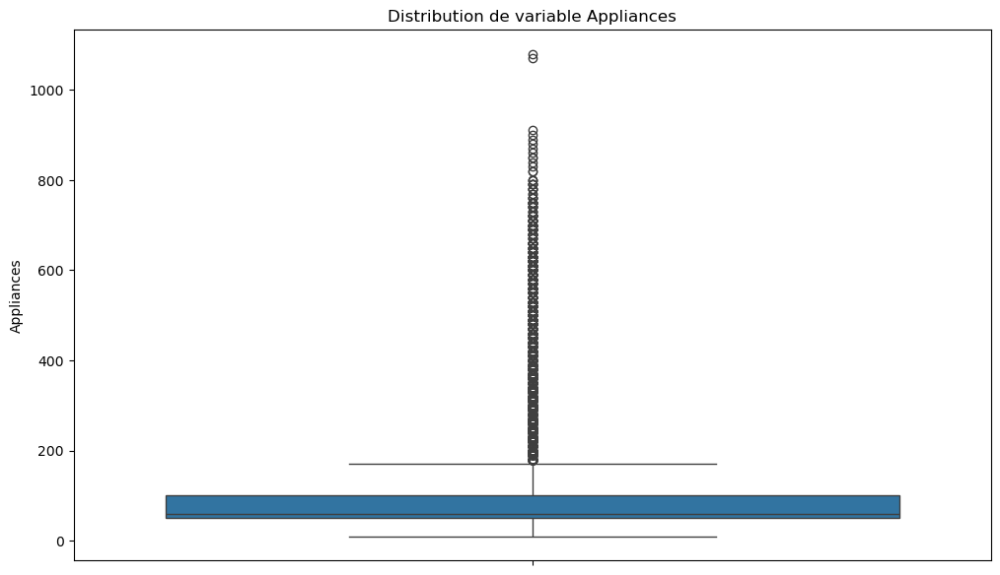

In [45]:
#boxplots de variable Target et lights
plt.figure (figsize=(12,7))               
plt.title("Distribution de variable Appliances")
sns.boxplot(data['Appliances']) 
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
D'après le Boxplot de Target nous constatons qu'il y a des valeurs <b>abberantes (outliers)</b>, dans ce cas nous avons besoin d'ajuster ces valeurs par l'utilisation de <b>IQR</b>,<br> ç-à-d: <b> Au lieu de supprimer les outliers, nous pouvons remplacer les valeurs extrêmes par les limites supérieures ou inférieures</b><br>
</p>

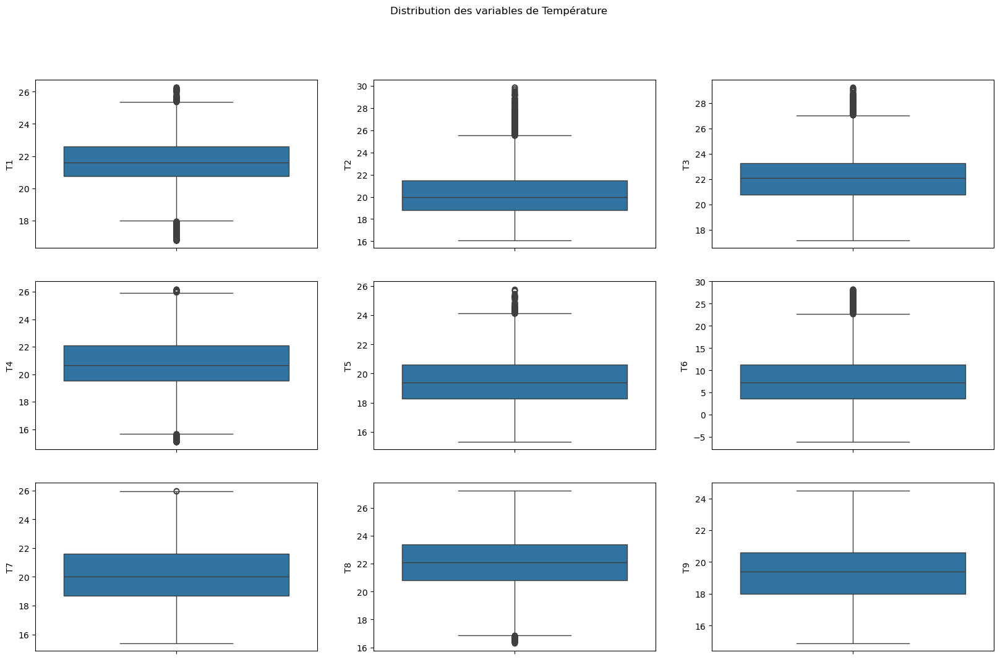

In [47]:
#boxplots de variables de Température
fig,ax = plt.subplots(3,3, figsize=(20,12))               
plt.suptitle("Distribution des variables de Température")
sns.boxplot(data['T1'], ax = ax[0,0]) 
sns.boxplot(data['T2'], ax = ax[0,1]) 
sns.boxplot(data['T3'], ax = ax[0,2])  
sns.boxplot(data['T4'], ax = ax[1,0])  
sns.boxplot(data['T5'], ax = ax[1,1])  
sns.boxplot(data['T6'], ax = ax[1,2])  
sns.boxplot(data['T7'], ax = ax[2,0])  
sns.boxplot(data['T8'], ax = ax[2,1]) 
sns.boxplot(data['T9'], ax = ax[2,2])  
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
D'après le Boxplot de Température nous constatons que les variables de <b>T1 à T6 et T8</b> contient des <b>valeurs abberantes (outliers)</b>, dans ce cas nous doivons passer par une étape de <b>la mise à l'échelle</b>, nous aurons faire une <b>Normalisation</b><br>
</p>

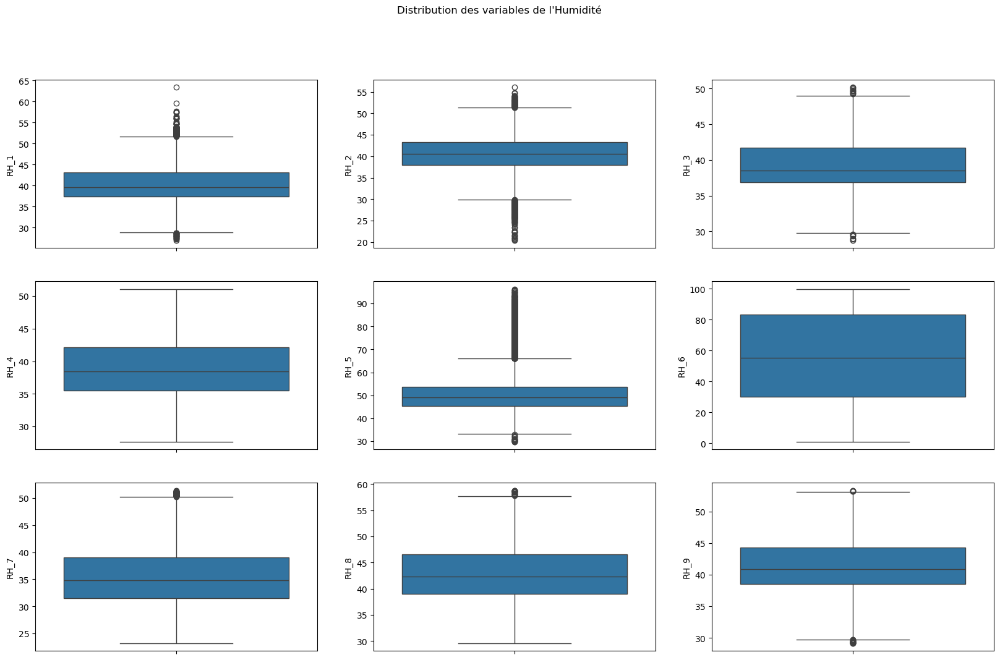

In [49]:
#boxplots de variables de Humidité
fig,ax = plt.subplots(3,3, figsize=(20,12))               
plt.suptitle("Distribution des variables de l'Humidité")
sns.boxplot(data['RH_1'], ax = ax[0,0]) 
sns.boxplot(data['RH_2'], ax = ax[0,1]) 
sns.boxplot(data['RH_3'], ax = ax[0,2])  
sns.boxplot(data['RH_4'], ax = ax[1,0])  
sns.boxplot(data['RH_5'], ax = ax[1,1])  
sns.boxplot(data['RH_6'], ax = ax[1,2])  
sns.boxplot(data['RH_7'], ax = ax[2,0])  
sns.boxplot(data['RH_8'], ax = ax[2,1]) 
sns.boxplot(data['RH_9'], ax = ax[2,2])  
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
Dans ce cas,les variables suivent une distribution proche de la normale, nous avons besoin d'une <b>Standardisation</b><br>
</p>

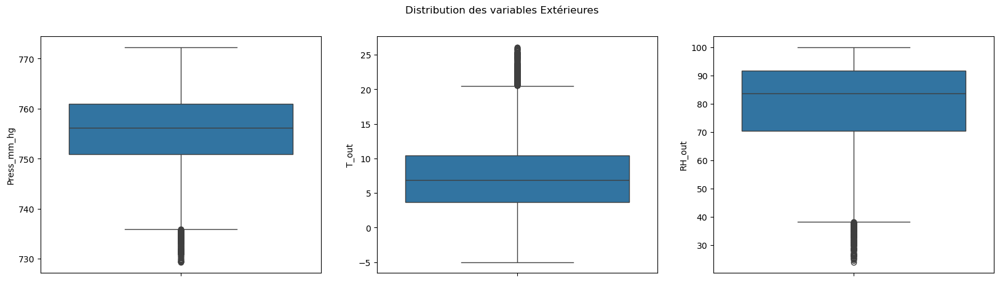

In [51]:
#boxplots des variables exterieures
fig,ax = plt.subplots(1,3, figsize=(20,5))               
plt.suptitle("Distribution des variables Extérieures")
sns.boxplot(data['Press_mm_hg'], ax = ax[0]) 
sns.boxplot(data['T_out'], ax = ax[1]) 
sns.boxplot(data['RH_out'], ax = ax[2]) 
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
Dans ce cas, nous avons besoin d'une <b>Nomalisation</b> pour les variables extérieures.<br>
</p>

<h2 style="color:green">3. Relations entre les variables :</h2>

<h3 style="color:#228B22">a. Corrélations en paires (pairplot)</h3>

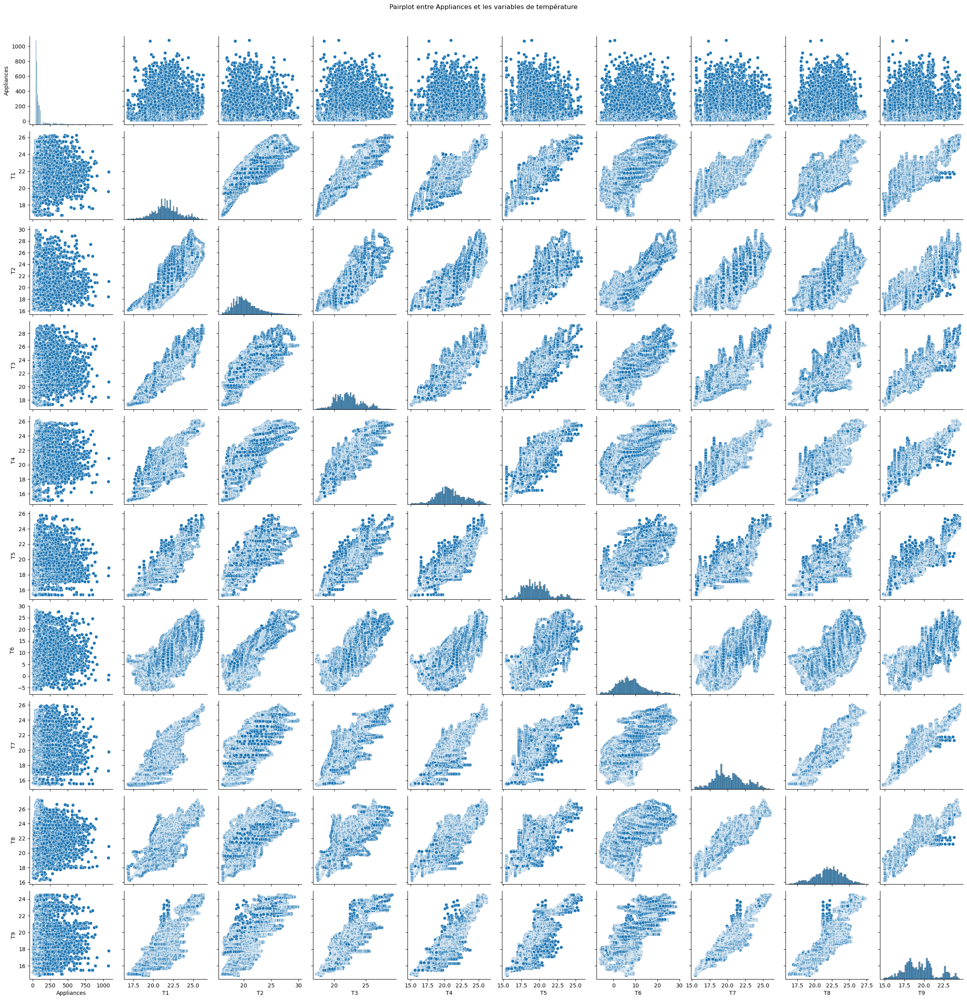

In [55]:
# Pairplot entre Appliances et les variables de température
sns.pairplot(data, vars=['Appliances'] + temp_cols)
plt.suptitle('Pairplot entre Appliances et les variables de température', y=1.02)
plt.show()

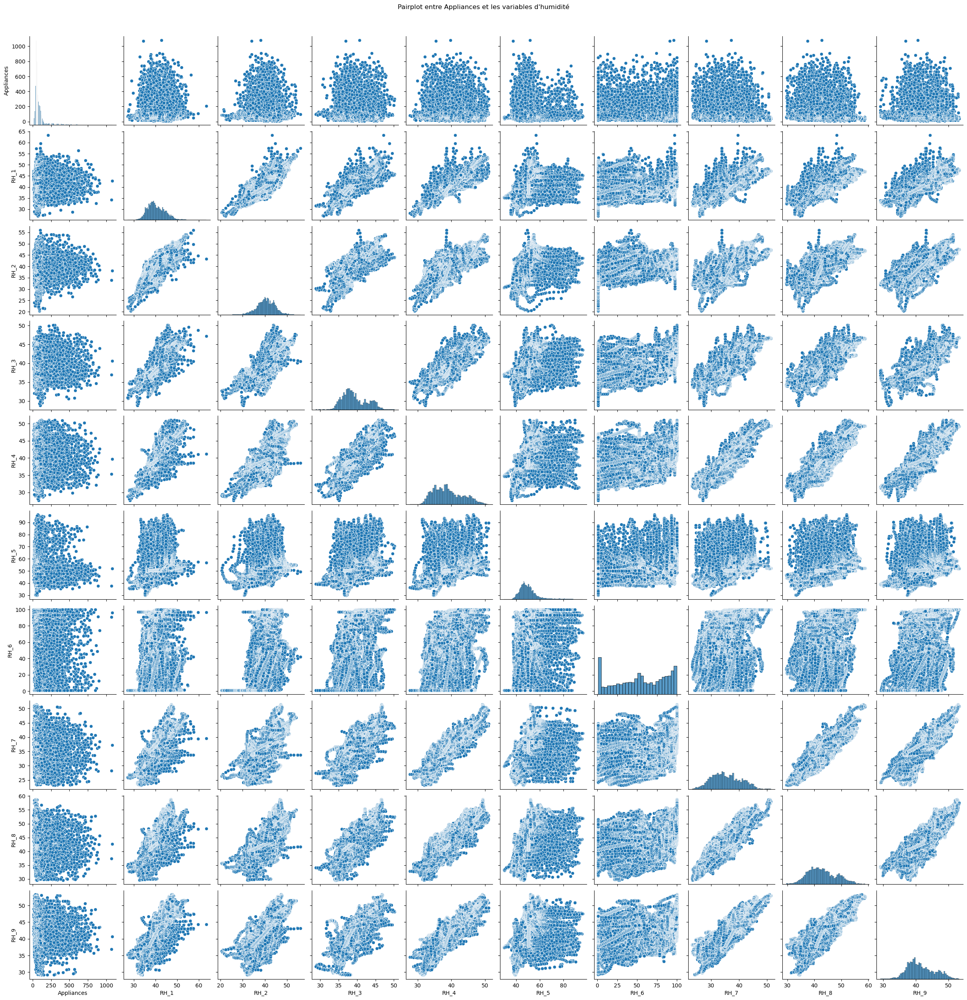

In [56]:
# Pairplot entre Appliances et les variables d'humidité
sns.pairplot(data, vars=['Appliances'] + humidity_cols)
plt.suptitle('Pairplot entre Appliances et les variables d\'humidité', y=1.02)
plt.show()

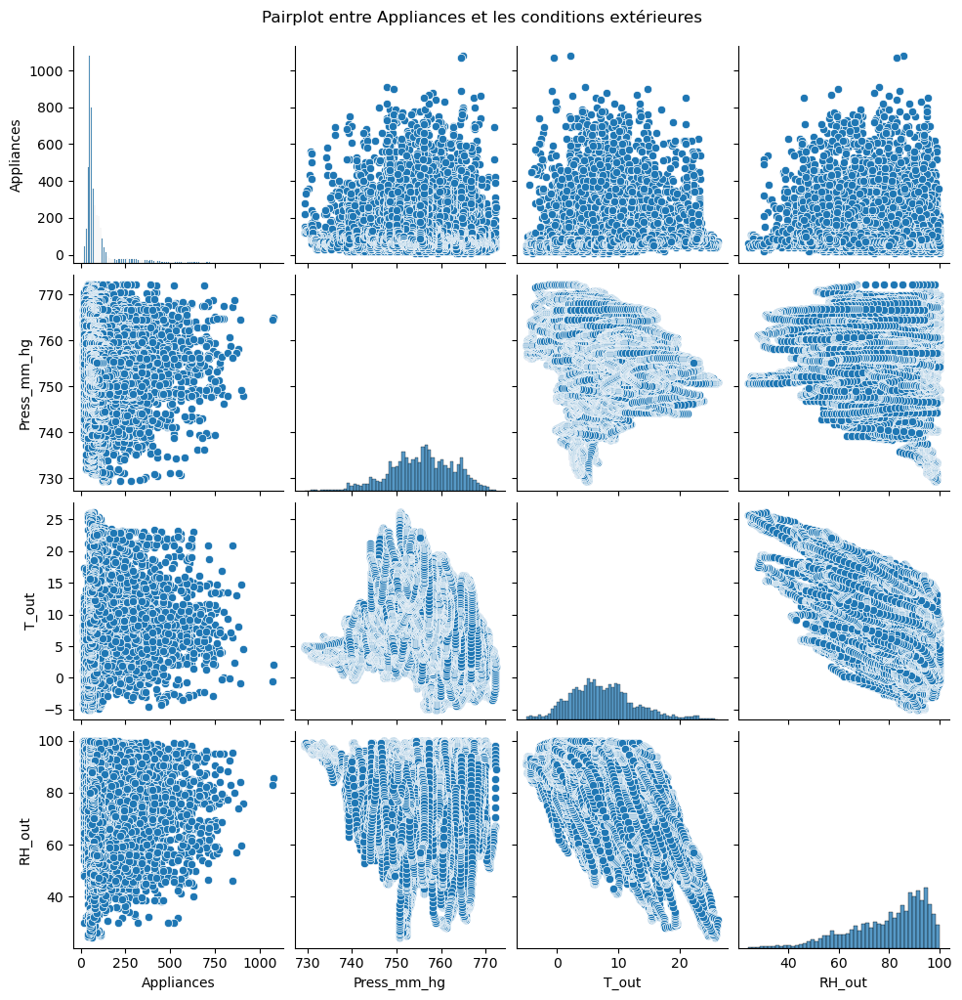

In [57]:
# Pairplot entre Appliances et les conditions extérieures
sns.pairplot(data, vars=['Appliances'] + external_cols)
plt.suptitle('Pairplot entre Appliances et les conditions extérieures', y=1.02)
plt.show()

<h3 style="color:#228B22">b. La Matrice de Corrélation</h3>

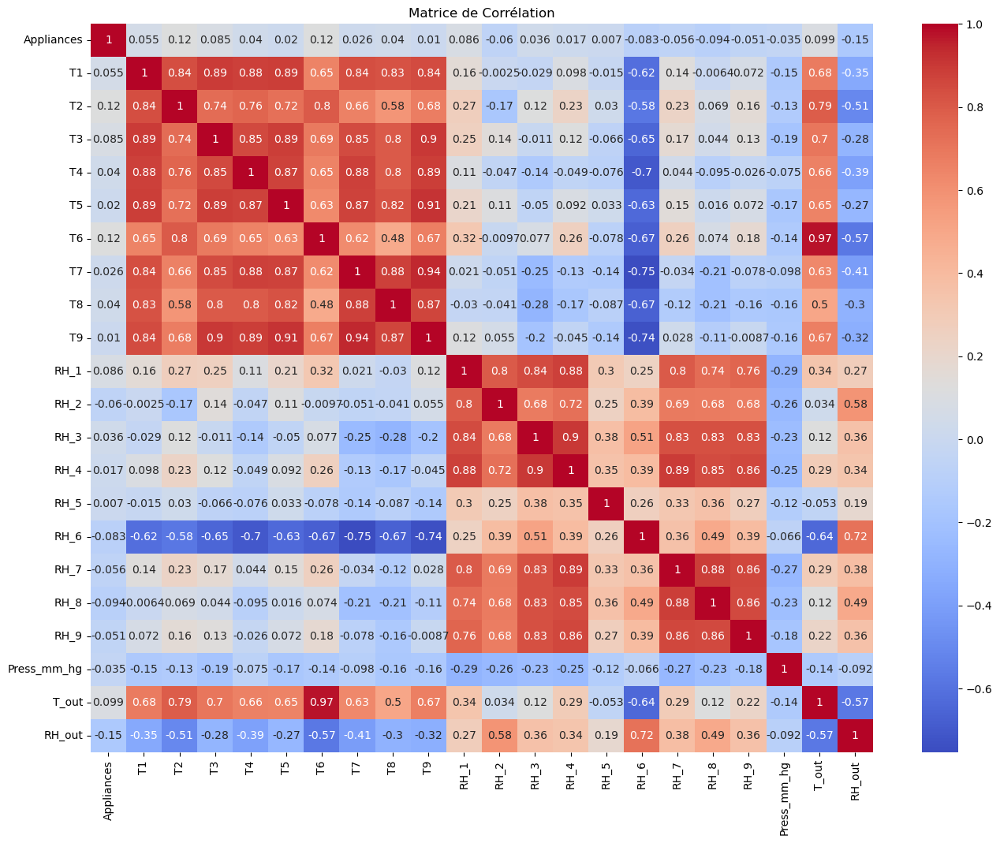

In [59]:
# Visualiser la matrice de corrélation
plt.figure(figsize=(16, 12))
correlation_matrix = data[essential_col].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Matrice de Corrélation')
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
<b>A partir la Matrice de Corrélation nous constatons que :</b><br>
1. La variable target <b>'Appliances'</b> semble <b>faiblement corrélée</b> avec toutes les variables. Les coefficients de corrélation avec les autres variables sont faibles (proches de 0). Cela indique qu'il n'y a <b>pas de forte relation linéaire directe entre "Appliances" et les autres variables</b>.<br>
2. Les variables de température (<b>T1, T2, ... T9</b>) sont <b>fortement corrélées</b> entre elles (coefficients proches de 1). Cela montre qu'elles sont <b>redondantes</b>.
Exemple : T7 et T9 ont une corrélation de 0.94, ce qui indique une relation presque parfaite.<br>
3. Certaines variables d'humidité relative (<b>RH_1, RH_2, ...</b>) sont également <b>corrélées</b> entre elles.
Exemple : RH_3 et RH_4 ont une corrélation de 0.9, indiquant une forte relation.<br>
4. Certaines variables sont <b>très similaires</b>, comme : <b>T6</b> et <b>T2</b> ; <b>RH_1</b> et <b>RH_4</b>. Cela signifie que nous pourrons <b>réduire la dimensionnalité </b>(par exemple, en supprimant les variables fortement corrélées) pour éviter les redondances.<br>
</p>

<h1 style="color:darkred">II. Pré-Traitement de Données </h1>

<h2 style="color:green">1. Mise à l'échelle des données :</h2>

In [63]:
# Filtrer le DataFrame pour ne conserver que les colonnes essentielles
data_filtered = data[essential_col]

In [64]:
data_filtered.describe()

,Appliances,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,Press_mm_hg,T_out,RH_out
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,21.686571,20.341219,22.267611,20.855335,19.592106,7.910939,20.267106,22.029107,19.485828,...,39.242500,39.026904,50.949283,54.609083,35.388200,42.936165,41.552401,755.522602,7.411665,79.750418
std,102.524891,1.606066,2.192974,2.006111,2.042884,1.844623,6.090347,2.109993,1.956162,2.014712,...,3.254576,4.341321,9.022034,31.149806,5.114208,5.224361,4.151497,7.399441,5.317409,14.901088
min,10.000000,16.790000,16.100000,17.200000,15.100000,15.330000,-6.065000,15.390000,16.306667,14.890000,...,28.766667,27.660000,29.815000,1.000000,23.200000,29.600000,29.166667,729.300000,-5.000000,24.000000
25%,50.000000,20.760000,18.790000,20.790000,19.530000,18.277500,3.626667,18.700000,20.790000,18.000000,...,36.900000,35.530000,45.400000,30.025000,31.500000,39.066667,38.500000,750.933333,3.666667,70.333333
50%,60.000000,21.600000,20.000000,22.100000,20.666667,19.390000,7.300000,20.033333,22.100000,19.390000,...,38.530000,38.400000,49.090000,55.290000,34.863333,42.375000,40.900000,756.100000,6.916667,83.666667
75%,100.000000,22.600000,21.500000,23.290000,22.100000,20.619643,11.256000,21.600000,23.390000,20.600000,...,41.760000,42.156667,53.663333,83.226667,39.000000,46.536000,44.338095,760.933333,10.408333,91.666667
max,1080.000000,26.260000,29.856667,29.236000,26.200000,25.795000,28.290000,26.000000,27.230000,24.500000,...,50.163333,51.090000,96.321667,99.900000,51.400000,58.780000,53.326667,772.300000,26.100000,100.000000


<h3 style="color:#228B22">a. Utilisation du Méthode IQR sur le Target </h3>

In [66]:
# Calcul des quantiles et de l'IQR
Q1 = data_filtered['Appliances'].quantile(0.25)  
Q3 = data_filtered['Appliances'].quantile(0.75)  
IQR = Q3 - Q1                           

# Calcul des limites
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"Limite inférieure : {lower_bound}")
print(f"Limite supérieure : {upper_bound}")

Limite inférieure : -25.0
Limite supérieure : 175.0


In [67]:
# Remplacer les outliers
data_filtered['Appliances'] = data_filtered['Appliances'].clip(lower=lower_bound, upper=upper_bound)

C:\Users\abdel\AppData\Local\Temp\ipykernel_7620\2967218752.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Appliances'] = data_filtered['Appliances'].clip(lower=lower_bound, upper=upper_bound)


<function matplotlib.pyplot.show(close=None, block=None)>

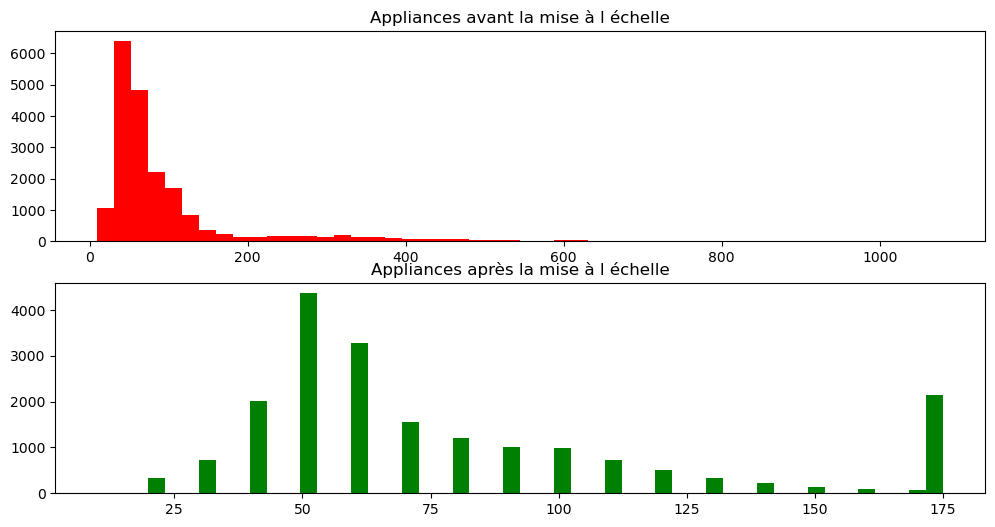

In [68]:
# Q17: Affichez le histogrammes  variable target avant et après la mise à l'échelle.
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.hist(data['Appliances'], bins=50, color='red')
plt.title('Appliances avant la mise à l échelle')
plt.subplot(2,1,2)
plt.hist(data_filtered['Appliances'], bins=50, color= 'green')
plt.title('Appliances après la mise à l échelle')
plt.show

<h3 style="color:#228B22">b. Normalisation des variables de Température </h3>

In [70]:
#Définir la fonction de Normalisation MinMax Scaling
def min_max_scaling(data, columns):
    for col in columns:
        min_val = data[col].min()
        max_val = data[col].max()
        data[col] = (data[col] - min_val) / (max_val - min_val)
    return data

In [71]:
#Appliquer sur les colonnes de Température
data_filtered = min_max_scaling(data_filtered,temp_cols)

C:\Users\abdel\AppData\Local\Temp\ipykernel_7620\3379581194.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col] = (data[col] - min_val) / (max_val - min_val)


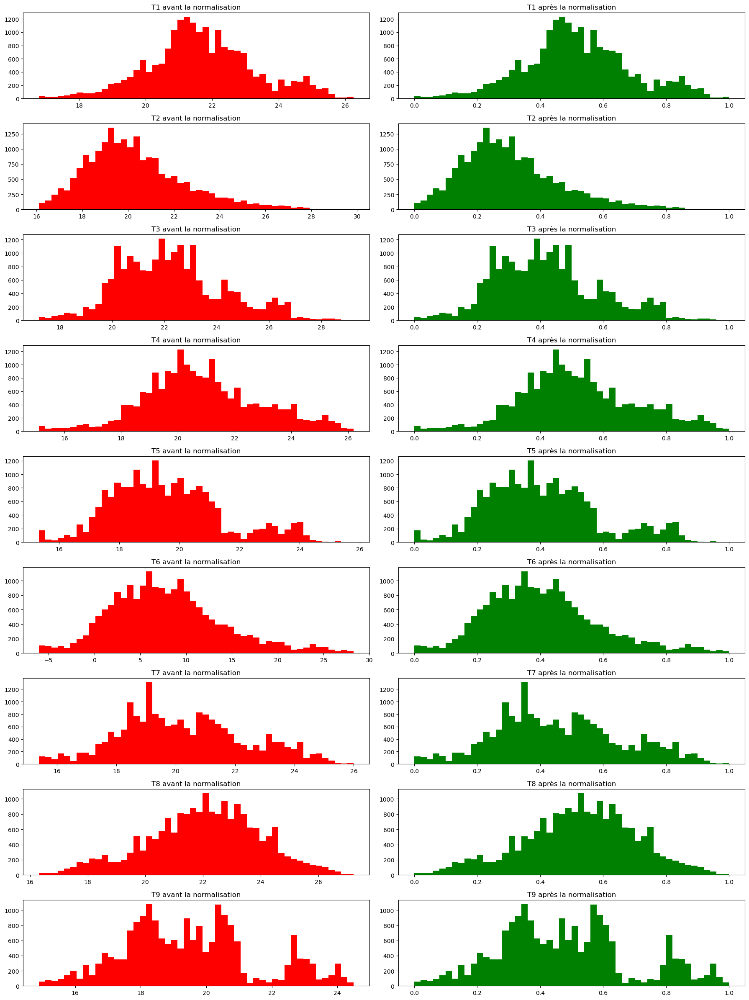

In [72]:
# Afficher les histogrammes avant et après la normalisation
plt.figure(figsize=(18, 24))

for i, col in enumerate(temp_cols):
    plt.subplot(9, 2, 2*i+1)
    plt.hist(data[col], bins=50, color='red')
    plt.title(f'{col} avant la normalisation')

    plt.subplot(9, 2, 2*i+2)
    plt.hist(data_filtered[col], bins=50, color='green')
    plt.title(f'{col} après la normalisation')

plt.tight_layout()
plt.show()

<h3 style="color:#228B22">c. Standardisation des variables de Humidité (z-score) </h3>

In [74]:
#Définir la fonction de Standardisation
def standarize(data, columns):
    for col in columns:
        mean_val = data[col].mean()
        std_val = data[col].std()
        data[col] = (data[col] - mean_val) / std_val
    return data

In [75]:
#Appliquer sur les colonnes de l Humodité
data_filtered = standarize(data_filtered, humidity_cols)

C:\Users\abdel\AppData\Local\Temp\ipykernel_7620\524606161.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col] = (data[col] - mean_val) / std_val


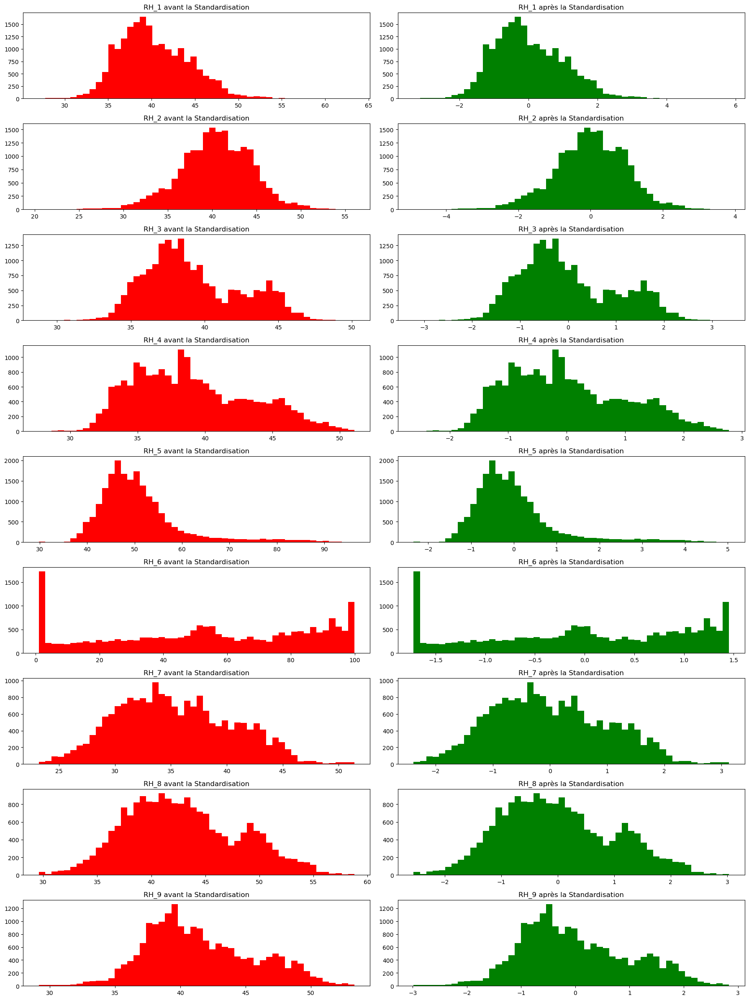

In [76]:
# Afficher les histogrammes avant et après la standardisation
plt.figure(figsize=(18, 24))

for i, col in enumerate(humidity_cols):
    plt.subplot(9, 2, 2*i+1)
    plt.hist(data[col], bins=50, color='red')
    plt.title(f'{col} avant la Standardisation')

    plt.subplot(9, 2, 2*i+2)
    plt.hist(data_filtered[col], bins=50, color='green')
    plt.title(f'{col} après la Standardisation')

plt.tight_layout()
plt.show()

<h3 style="color:#228B22">d. Standardisation (z-score) des variables Extérieures </h3>

In [78]:
# Appliquer sur colonnes extérieures
data_filtered = standarize(data_filtered, external_cols)

C:\Users\abdel\AppData\Local\Temp\ipykernel_7620\524606161.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col] = (data[col] - mean_val) / std_val


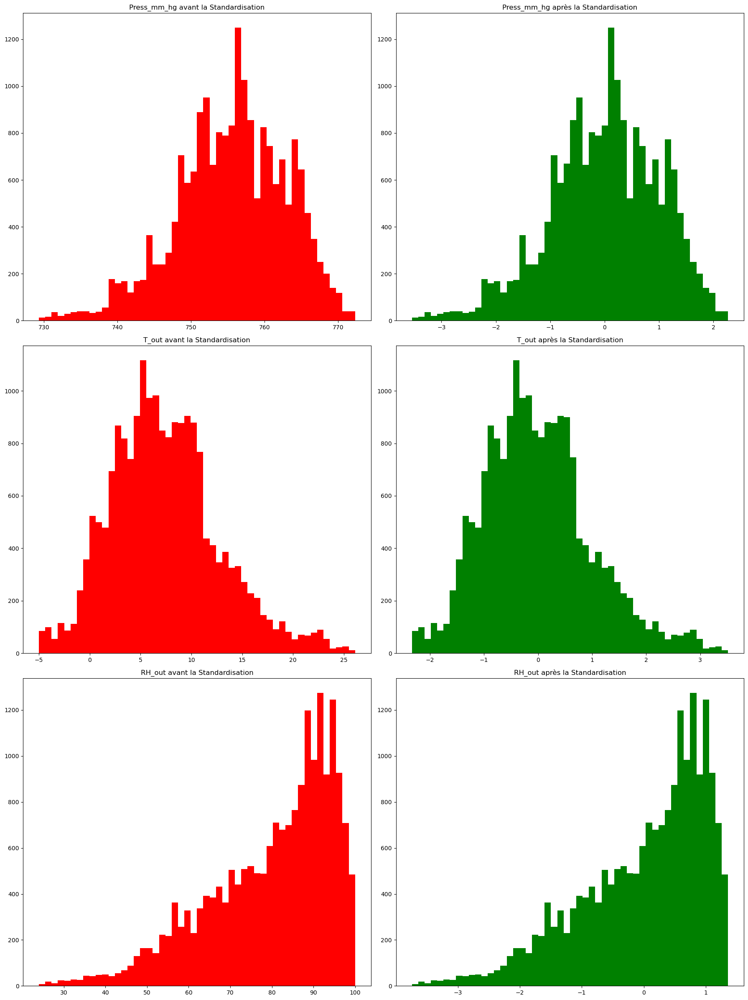

In [79]:
# Afficher les histogrammes avant et après la standardisation
plt.figure(figsize=(18, 24))

for i, col in enumerate(external_cols):
    plt.subplot(3, 2, 2*i+1)
    plt.hist(data[col], bins=50, color='red')
    plt.title(f'{col} avant la Standardisation')

    plt.subplot(3, 2, 2*i+2)
    plt.hist(data_filtered[col], bins=50, color='green')
    plt.title(f'{col} après la Standardisation')

plt.tight_layout()
plt.show()

In [80]:
#Dataset après la mise à l'echelle
data_filtered.head(10)

,Appliances,T1,T2,T3,T4,T5,T6,T7,T8,T9,...,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,Press_mm_hg,T_out,RH_out
0,60,0.32735,0.225345,0.215188,0.351351,0.175506,0.381070,0.170594,0.173329,0.223032,...,1.686087,1.506399,0.471148,0.951774,1.219830,1.141543,0.958112,-2.976252,-0.152643,0.822060
1,60,0.32735,0.225345,0.215188,0.351351,0.175506,0.375443,0.170594,0.173329,0.226500,...,1.704523,1.604488,0.471148,0.945568,1.206795,1.134525,0.965338,-2.962738,-0.174583,0.822060
2,50,0.32735,0.225345,0.215188,0.344745,0.175506,0.367487,0.170594,0.173329,0.219563,...,1.748563,1.580878,0.458956,0.916461,1.182027,1.109004,0.950886,-2.949223,-0.196524,0.822060
3,50,0.32735,0.225345,0.215188,0.341441,0.175506,0.363800,0.164310,0.164175,0.219563,...,1.769047,1.542487,0.458956,0.925022,1.154001,1.082206,0.926798,-2.935709,-0.218464,0.822060
4,60,0.32735,0.225345,0.215188,0.341441,0.178691,0.361859,0.170594,0.164175,0.219563,...,1.769047,1.497953,0.458956,0.972213,1.142269,1.082206,0.926798,-2.922194,-0.240405,0.822060
5,50,0.32735,0.225345,0.215188,0.341441,0.172320,0.359918,0.164310,0.164175,0.219563,...,1.748563,1.544022,0.452306,1.000250,1.148135,1.082206,0.900301,-2.908680,-0.262345,0.822060
6,60,0.32735,0.225345,0.215188,0.341441,0.169135,0.358851,0.164310,0.164175,0.219563,...,1.738321,1.557843,0.445286,1.010630,1.136403,1.082206,0.900301,-2.895165,-0.284286,0.822060
7,60,0.32383,0.225345,0.210203,0.341441,0.169135,0.356717,0.161169,0.164175,0.219563,...,1.738321,1.574735,0.437897,1.021331,1.136403,1.082206,0.900301,-2.886155,-0.281152,0.810875
8,60,0.31679,0.225345,0.210203,0.341441,0.175506,0.354776,0.167452,0.164175,0.219563,...,1.704523,1.557843,0.448980,1.047120,1.175509,1.082206,0.900301,-2.877146,-0.278017,0.799690
9,70,0.32383,0.227526,0.215188,0.341441,0.169135,0.356717,0.170594,0.164175,0.219563,...,1.727055,1.628482,0.448980,1.059961,1.195063,1.082206,0.900301,-2.868136,-0.274883,0.788505


<h2 style="color:green">2. Analyse en Composantes Principales (ACP) :</h2>

<h3 style="color:#228B22">a. Calculer la Matrice de Correlation </h3>

In [83]:
#Creer une dataframe incluse toutes les variables sans le variable Target(Appliances)
data_reduit = data_filtered[ temp_cols + humidity_cols + external_cols ].copy()

In [84]:
data_reduit.head()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,RH_1,...,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,Press_mm_hg,T_out,RH_out
0,0.32735,0.225345,0.215188,0.351351,0.175506,0.381070,0.170594,0.173329,0.223032,1.843774,...,1.686087,1.506399,0.471148,0.951774,1.219830,1.141543,0.958112,-2.976252,-0.152643,0.82206
1,0.32735,0.225345,0.215188,0.351351,0.175506,0.375443,0.170594,0.173329,0.226500,1.616766,...,1.704523,1.604488,0.471148,0.945568,1.206795,1.134525,0.965338,-2.962738,-0.174583,0.82206
2,0.32735,0.225345,0.215188,0.344745,0.175506,0.367487,0.170594,0.173329,0.219563,1.517921,...,1.748563,1.580878,0.458956,0.916461,1.182027,1.109004,0.950886,-2.949223,-0.196524,0.82206
3,0.32735,0.225345,0.215188,0.341441,0.175506,0.363800,0.164310,0.164175,0.219563,1.459284,...,1.769047,1.542487,0.458956,0.925022,1.154001,1.082206,0.926798,-2.935709,-0.218464,0.82206
4,0.32735,0.225345,0.215188,0.341441,0.178691,0.361859,0.170594,0.164175,0.219563,1.526298,...,1.769047,1.497953,0.458956,0.972213,1.142269,1.082206,0.926798,-2.922194,-0.240405,0.82206


In [85]:
#La matrice de correlation (utilise la fonction corr() )
matrice_corr = data_reduit.corr()
matrice_corr

,T1,T2,T3,T4,T5,T6,T7,T8,T9,RH_1,...,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,Press_mm_hg,T_out,RH_out
T1,1.000000,0.836834,0.892402,0.877001,0.885247,0.654769,0.838705,0.825413,0.844777,0.164006,...,-0.028550,0.097861,-0.014782,-0.615045,0.135182,-0.006441,0.071756,-0.150574,0.682846,-0.345481
T2,0.836834,1.000000,0.735245,0.762066,0.720550,0.801186,0.663660,0.578191,0.675535,0.269839,...,0.121497,0.231563,0.029595,-0.580372,0.229212,0.068534,0.157346,-0.133028,0.792255,-0.505291
T3,0.892402,0.735245,1.000000,0.852778,0.888169,0.686882,0.847374,0.795283,0.901324,0.253230,...,-0.011234,0.122737,-0.066355,-0.647672,0.172624,0.044427,0.134602,-0.189974,0.699417,-0.281718
T4,0.877001,0.762066,0.852778,1.000000,0.871813,0.652350,0.877763,0.796256,0.889439,0.106180,...,-0.140457,-0.048650,-0.076489,-0.703149,0.043527,-0.095192,-0.025549,-0.075292,0.663478,-0.388602
T5,0.885247,0.720550,0.888169,0.871813,1.000000,0.629161,0.870624,0.824981,0.911055,0.205797,...,-0.050062,0.091812,0.032786,-0.632384,0.148905,0.016388,0.072308,-0.170999,0.651321,-0.273953
T6,0.654769,0.801186,0.686882,0.652350,0.629161,1.000000,0.619085,0.482836,0.667177,0.316141,...,0.076833,0.259047,-0.078337,-0.672137,0.256077,0.073721,0.184424,-0.141643,0.974787,-0.569119
T7,0.838705,0.663660,0.847374,0.877763,0.870624,0.619085,1.000000,0.882123,0.944776,0.021397,...,-0.250090,-0.131204,-0.142823,-0.753973,-0.033948,-0.209961,-0.077690,-0.097724,0.631293,-0.411213
T8,0.825413,0.578191,0.795283,0.796256,0.824981,0.482836,0.882123,1.000000,0.869338,-0.030053,...,-0.283228,-0.167066,-0.086991,-0.665869,-0.124102,-0.209532,-0.156820,-0.162855,0.502842,-0.300438
T9,0.844777,0.675535,0.901324,0.889439,0.911055,0.667177,0.944776,0.869338,1.000000,0.115263,...,-0.195270,-0.044518,-0.138509,-0.738940,0.028055,-0.113014,-0.008683,-0.156828,0.668220,-0.318848
RH_1,0.164006,0.269839,0.253230,0.106180,0.205797,0.316141,0.021397,-0.030053,0.115263,1.000000,...,0.844677,0.880359,0.303258,0.245126,0.801122,0.736196,0.764001,-0.293957,0.340767,0.274126


<h3 style="color:#228B22">b. Les Valeurs et les Vecteurs Propres </h3>

In [87]:
#Déterminer les valeurs/vecteurs propres
valeurs_propres, vecteurs_propres = np.linalg.eig(matrice_corr)

In [88]:
print('Les Valeurs Propres sont :', valeurs_propres)

Les Valeurs Propres sont : [8.87659153 6.62482339 1.53635636 0.92256645 0.88613419 0.52113192
 0.32085364 0.2368944  0.17936018 0.1459991  0.13946876 0.11973457
 0.11069342 0.09455981 0.01320827 0.01770589 0.0736671  0.02664715
 0.06434783 0.04342892 0.04582711]


In [89]:
print('Les Vecteurs Propres sont:', vecteurs_propres)

Les Vecteurs Propres sont: [[-3.07148367e-01  5.18480200e-02  1.06161098e-01 -5.81362633e-02
   1.09358101e-01  2.98293655e-01  1.84987849e-01  7.17041391e-02
  -2.45532508e-01  1.61351226e-01  9.08286410e-02 -2.85968717e-01
   2.15570976e-01  2.18500878e-01  3.34244343e-01  1.87202833e-01
   3.36293362e-01  1.76588426e-02  4.05899557e-02 -4.40130866e-01
   1.48079535e-01]
 [-2.80645009e-01  7.93226948e-02 -2.44507263e-01 -1.37737692e-01
   8.85901405e-02  4.13426532e-01  2.36261347e-01  2.36898451e-01
   9.10580922e-03 -4.26492095e-02 -1.95780510e-01  2.05549051e-01
  -1.64479352e-01 -1.93178080e-02 -4.95309065e-01 -3.17328471e-01
   6.36685273e-02 -2.04104054e-01  1.61668114e-01 -1.32631337e-01
   1.01810268e-02]
 [-3.05482808e-01  7.40702074e-02  1.52598409e-01  6.38837485e-02
   4.30772993e-03  2.51956653e-02  1.10182486e-02  5.71103703e-02
   1.81102882e-02  6.63309564e-01 -2.89784763e-02 -6.98345198e-02
   5.28766736e-02  3.03803051e-01 -5.83858342e-02 -5.56627367e-02
  -4.566738

<h3 style="color:#228B22">d. Appliquer l ACP</h3>

In [91]:
#Cree un objet PCA avec n_componenets= nombre de variables
from sklearn.decomposition import PCA
pca = PCA(n_components=data_reduit.shape[1])
#Calcul des composantes principales avec fit
pca.fit(data_reduit)

PCA(n_components=21)

In [92]:
# La variance expliqué par chacune des composantes
variance=pca.explained_variance_ratio_
variance

array([5.32935782e-01, 1.92092584e-01, 7.56086145e-02, 7.10231989e-02,
       4.40274369e-02, 2.85259948e-02, 1.33910981e-02, 9.76279937e-03,
       9.38612614e-03, 7.27538509e-03, 5.48532663e-03, 5.19962653e-03,
       3.58482998e-03, 4.57665069e-04, 3.55565997e-04, 2.85220137e-04,
       2.11117029e-04, 1.48610630e-04, 1.20899466e-04, 7.70050640e-05,
       4.51135367e-05])

In [93]:
# fonction pour afficher les composantes principales 
def plot_var_explique (acp):
    var_explique = acp.explained_variance_ratio_
    plt.bar(np.arange(len(var_explique ))+1, var_explique )
    plt.plot(np.arange(len(var_explique ))+1, var_explique .cumsum(),c="red",marker='o')
    plt.xlabel("la rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title(" Eboulis des valeurs propres")
    plt.show(block=False)

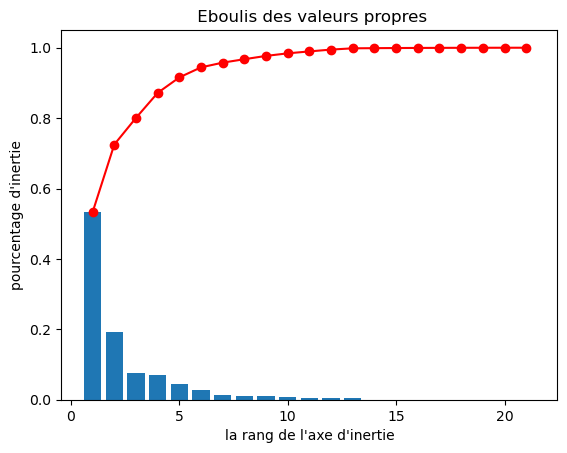

In [94]:
# Eboulis des valeurs propres 
plot_var_explique (pca)

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
Nous remarquons que la première composante principale représente une grande partie de l'inertie totale (environ <b>50 %</b>). Ensuite, la deuxième composante contribue également, mais avec une inertie plus faible (environ <b>15-20 %</b>). Après la troisième et quatrième composante, la contribution devient très faible, indiquant que ces dernières n'apportent que peu d'informations supplémentaires.<br>
Donc, nous devons sélectionner <b>6 composantes principales</b>, car elles expliquent une grande partie de la variance tout en réduisant la dimensionnalité des données.
</p>

In [96]:
# Appliquer l ACP pour avoir 6 composantes principales
pca=PCA(n_components=6)
pca.fit(data_reduit)

PCA(n_components=6)

In [97]:
# La projection sur les axes principales
projections=pca.transform(data_reduit)
projections

array([[ 4.13343598, -0.08486458, -2.41686134, -0.34019585, -0.74661415,
         0.66354541],
       [ 4.08383941, -0.125762  , -2.3934836 , -0.31920915, -0.81036774,
         0.57943642],
       [ 4.0156146 , -0.15005052, -2.38228201, -0.3139521 , -0.83613367,
         0.56272599],
       ...,
       [ 2.58635692,  4.39644599,  0.7425119 ,  0.12038391,  0.09076537,
        -0.37219324],
       [ 2.58956495,  4.3759849 ,  0.72355304,  0.08031074,  0.18932768,
        -0.33574169],
       [ 2.55379847,  4.32648703,  0.7229017 ,  0.08389425,  0.17219002,
        -0.40204767]])

In [98]:
#Creer une DataFrame avec la composante principale
data_reduit = pd.DataFrame(data=projections, columns=['Composante 1', 'Composante 2', 'Composante 3', 'Composante 4', 'Composante 5', 'Composante 6'])
data_reduit.head(10)

,Composante 1,Composante 2,Composante 3,Composante 4,Composante 5,Composante 6
0,4.133436,-0.084865,-2.416861,-0.340196,-0.746614,0.663545
1,4.083839,-0.125762,-2.393484,-0.319209,-0.810368,0.579436
2,4.015615,-0.150051,-2.382282,-0.313952,-0.836134,0.562726
3,3.956967,-0.190571,-2.378752,-0.303405,-0.846501,0.567894
4,3.961826,-0.222723,-2.370785,-0.302130,-0.850372,0.604911
5,3.937411,-0.262575,-2.358754,-0.298957,-0.876306,0.579213
6,3.910403,-0.294375,-2.346113,-0.300053,-0.890381,0.556619
7,3.896526,-0.301487,-2.333470,-0.299906,-0.911365,0.541636
8,3.893995,-0.304557,-2.325965,-0.286069,-0.920648,0.522578
9,3.974658,-0.270150,-2.307206,-0.286284,-0.922572,0.594230


<Figure size 1200x800 with 0 Axes>

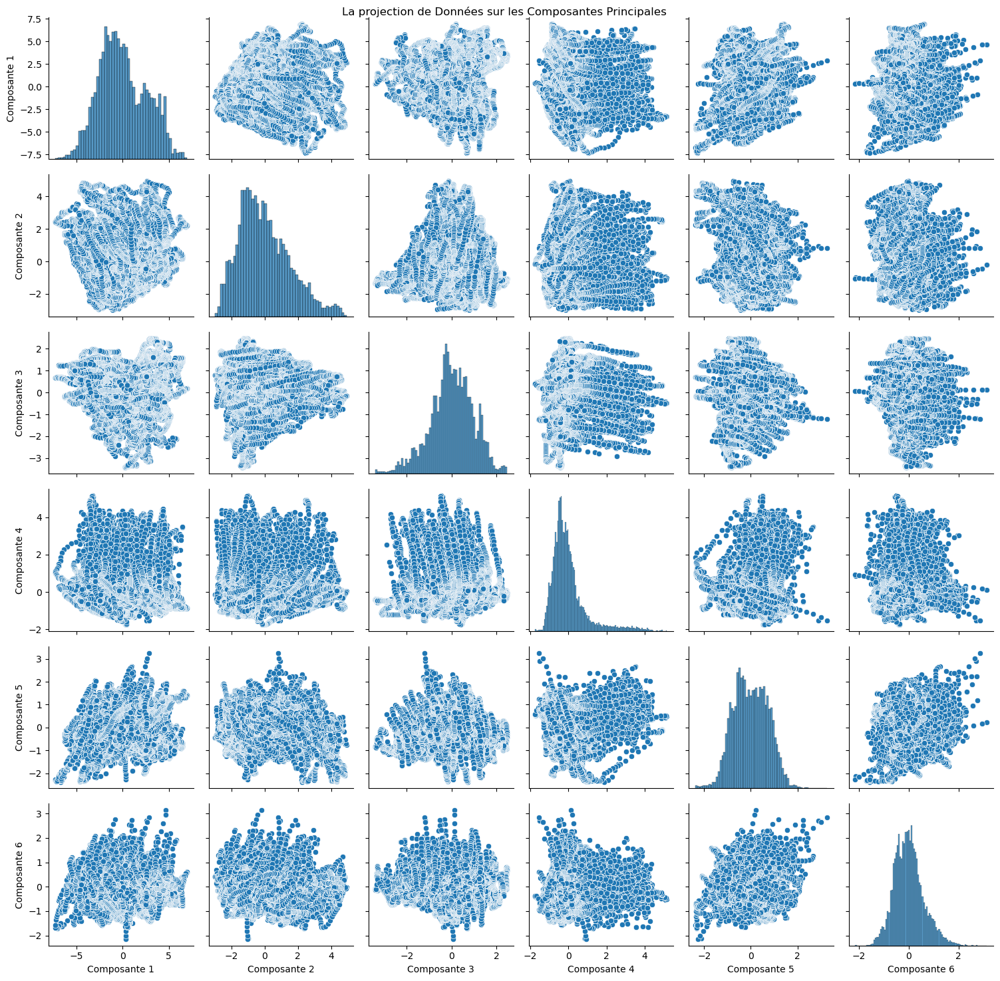

In [99]:
# Afficher la projection de Données sur les Composantes Principales
plt.figure(figsize=(12,8))
sns.pairplot(data_reduit)
plt.suptitle('La projection de Données sur les Composantes Principales')
plt.tight_layout()
plt.show()

In [100]:
# Ajouter le variable Target au data_reduit
data_reduit['Appliances'] = data_filtered['Appliances']

In [101]:
data_reduit.head()

,Composante 1,Composante 2,Composante 3,Composante 4,Composante 5,Composante 6,Appliances
0,4.133436,-0.084865,-2.416861,-0.340196,-0.746614,0.663545,60
1,4.083839,-0.125762,-2.393484,-0.319209,-0.810368,0.579436,60
2,4.015615,-0.150051,-2.382282,-0.313952,-0.836134,0.562726,50
3,3.956967,-0.190571,-2.378752,-0.303405,-0.846501,0.567894,50
4,3.961826,-0.222723,-2.370785,-0.302130,-0.850372,0.604911,60


<h1 style="color:darkred">III. Classification ( CAH )</h1>

<h2 style="color:green">1. Le nuage de points :</h2>

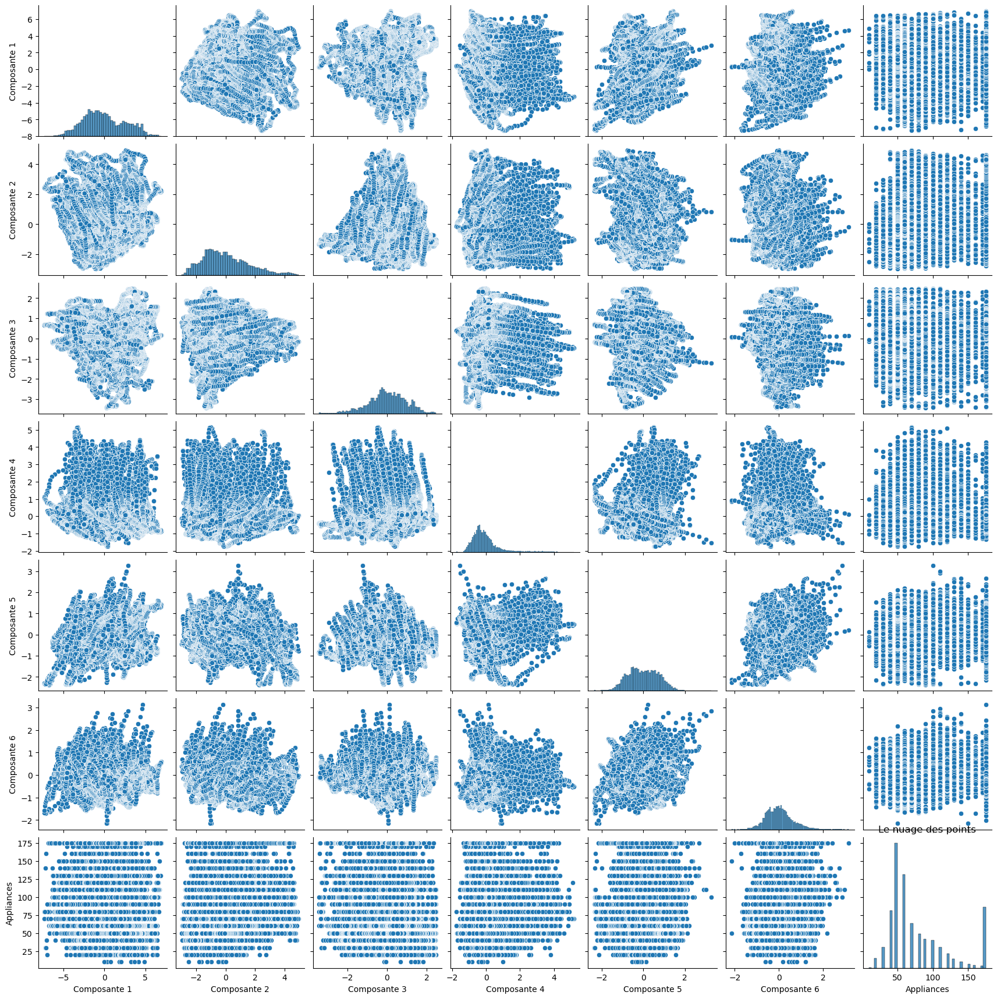

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.pairplot(data_reduit)
plt.title('Le nuage des points')
plt.show()

<h2 style="color:green">2. Linkage de Données (Ward) :</h2>

In [106]:
# Linkage avec la méthode de Ward
from scipy.cluster.hierarchy import dendrogram, linkage
data_cah=data_reduit.copy()
Z = linkage(data_cah, method='ward')

In [107]:
#Afficher la matrice de proximité
Z

array([[9.86200000e+03, 9.86300000e+03, 6.66585918e-03, 2.00000000e+00],
       [9.79200000e+03, 9.79300000e+03, 7.31184948e-03, 2.00000000e+00],
       [2.16800000e+03, 2.16900000e+03, 7.79308713e-03, 2.00000000e+00],
       ...,
       [3.94600000e+04, 3.94630000e+04, 1.52243047e+03, 5.99600000e+03],
       [3.94650000e+04, 3.94660000e+04, 3.55854532e+03, 1.67400000e+04],
       [3.94640000e+04, 3.94670000e+04, 7.29248359e+03, 1.97350000e+04]])

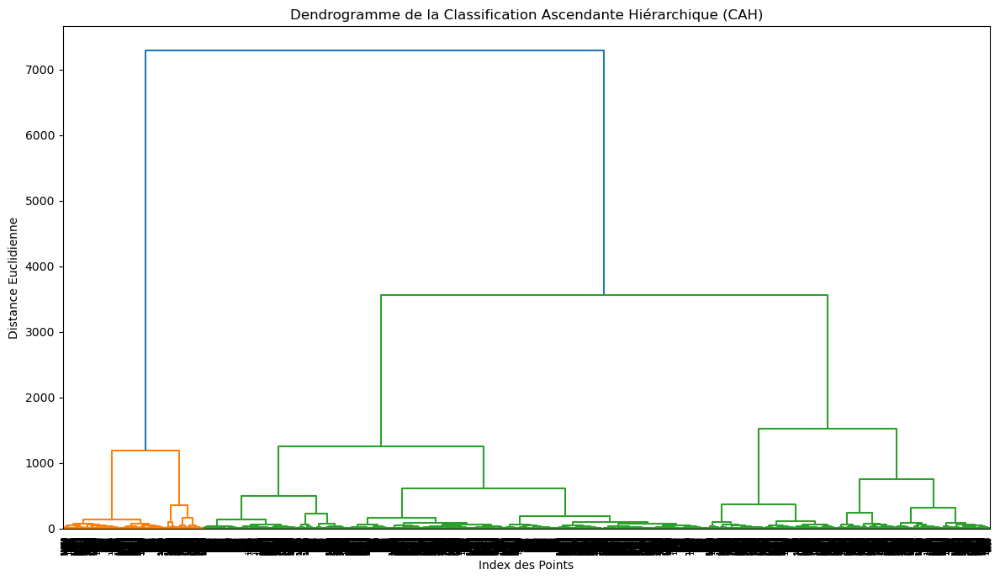

In [108]:
# Le dendrogramme de données
plt.figure(figsize=(12, 7))
dendrogram(Z, labels=data_cah.index, leaf_rotation=90)
plt.title('Dendrogramme de la Classification Ascendante Hiérarchique (CAH)')
plt.xlabel('Index des Points')
plt.ylabel('Distance Euclidienne')
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

<h3 style="color:#2F4F4F">Interprétation :</h3>
<p style="background-color:#FAFAD2">
En regardant la structure, il semble que :
<b>Un cluster majeur</b> regroupe plusieurs observations très proches (branches orange).
Un <b>autre cluster</b> regroupe des observations légèrement plus distantes (branches vertes).
Et une <b>séparation nette</b> est visible entre les branches principales (bleu), suggérant une division en clusters bien distincts.<br>
Donc on peut dire que Les observations peuvent être divisées en <b>2</b> ou <b>3 clusters significatifs</b>.
</p>

<h1 style="color:darkred">III. Classification ( Implémentation de l'algorithme K-Means )</h1>

<h2 style="color:green">1. Le nuage de points :</h2>

In [112]:
data_kmeans=pd.DataFrame(data=projections, columns=['Composante 1', 'Composante 2', 'Composante 3', 'Composante 4','Composante 5','Composante 6'])

In [113]:
data_kmeans

,Composante 1,Composante 2,Composante 3,Composante 4,Composante 5,Composante 6
0,4.133436,-0.084865,-2.416861,-0.340196,-0.746614,0.663545
1,4.083839,-0.125762,-2.393484,-0.319209,-0.810368,0.579436
2,4.015615,-0.150051,-2.382282,-0.313952,-0.836134,0.562726
3,3.956967,-0.190571,-2.378752,-0.303405,-0.846501,0.567894
4,3.961826,-0.222723,-2.370785,-0.302130,-0.850372,0.604911
...,...,...,...,...,...,...
19730,2.485389,4.453722,0.752127,0.175230,-0.001581,-0.515073
19731,2.467438,4.420792,0.744908,0.161945,0.014356,-0.487629
19732,2.586357,4.396446,0.742512,0.120384,0.090765,-0.372193
19733,2.589565,4.375985,0.723553,0.080311,0.189328,-0.335742


<h2 style="color:green">2. Déterminer le nombre optimal de clusters (k) pour K-Means :</h2>

<h4 style="color:#8B008B">Méthode du coude (Elbow Method) : </h4>
<p style="background-color:#FFFAF0">Cette méthode consiste à tracer la courbe de la somme des distances intra-cluster (ou "inertia") en fonction du nombre de clusters. L'idée est de trouver le point où la courbe commence à se stabiliser, ce qui représente le nombre de clusters optimal. Ce point est souvent appelé "coude".</p>

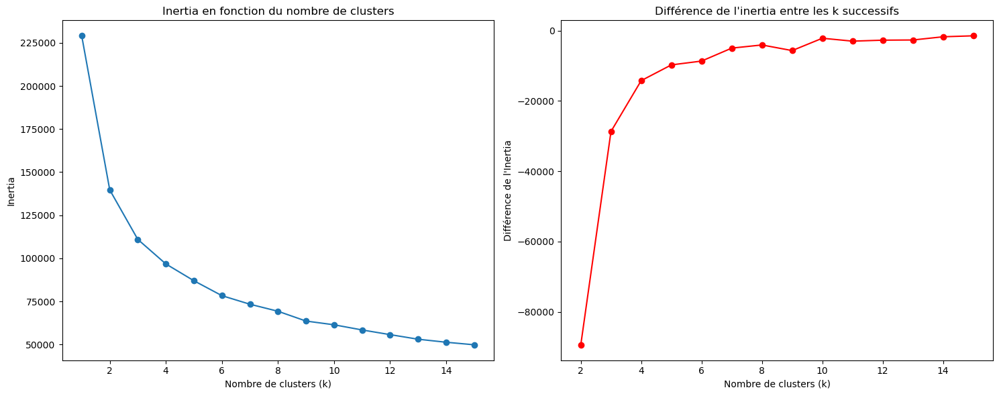

In [116]:
# Calcul de l'inertia pour différents k
from sklearn.cluster import KMeans
inertia = []
k_range = range(1, 16)  # Essayer k de 1 à 20

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_kmeans)  # Appliquer K-means sur les données réduites
    inertia.append(kmeans.inertia_)

# Calcul de la différence entre les inerties successives
inertia_diff = [inertia[i] - inertia[i-1] for i in range(1, len(inertia))]

# Tracer l'inertia et la différence de l'inertia
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Tracer l'inertia
ax1.plot(k_range, inertia, marker='o')
ax1.set_title('Inertia en fonction du nombre de clusters')
ax1.set_xlabel('Nombre de clusters (k)')
ax1.set_ylabel('Inertia')

# Tracer la différence d'inertia
ax2.plot(k_range[1:], inertia_diff, marker='o', color='r')
ax2.set_title('Différence de l\'inertia entre les k successifs')
ax2.set_xlabel('Nombre de clusters (k)')
ax2.set_ylabel('Différence de l\'Inertia')

plt.tight_layout()
plt.show()


<h2>Interprétation </h2>
<p style="background-color:#FAFAD2">
Le coude se situe là où la diminution de l’inertie ralentit de manière significative.<br>
D’après le graphique fourni, la différence d’inertie diminue fortement jusqu’à k = 4 ou 5, puis elle se stabilise.
Après k = 5, les gains sont minimes et l’ajout de clusters devient moins pertinent.</p>

<h2 style="color:green">3. Application de K-Means :</h2>

Centroids des 5 clusters :
[[ 0.91246619 -0.91490453 -0.56899564 -0.04317846 -0.07143852 -0.03869275]
 [ 3.82108126  0.32516848  0.47351001  0.07840966 -0.12970045  0.03829169]
 [-1.69758816 -1.12662639  0.06120245 -0.14614053  0.16760797 -0.01561594]
 [-3.63870103  1.35238011  0.46294744  0.23973957 -0.34105554  0.05202156]
 [-0.14906973  1.91291852 -0.24065886  0.03538259  0.24658086 -0.00481488]]


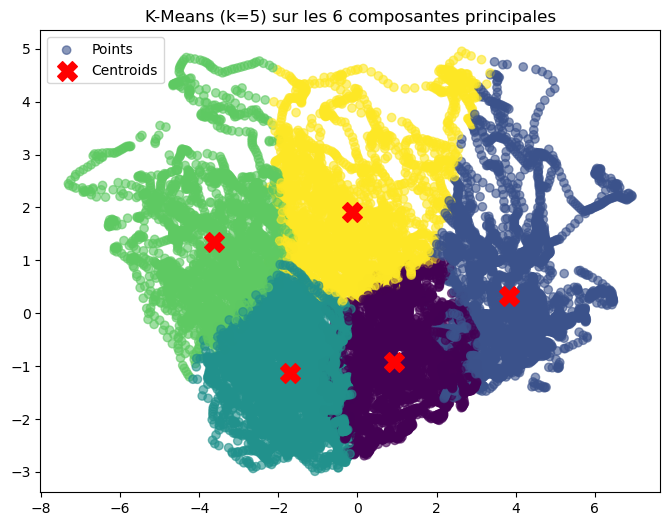

In [119]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Application de K-Means avec k=5
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(data_kmeans)

# Récupération des labels (assignation des points aux clusters) et des centroïdes
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Affichage des résultats
print("Centroids des 5 clusters :")
print(centroids)

# Affichage des résultats dans l'espace des 2 premières composantes principales
plt.figure(figsize=(8, 6))
plt.scatter(data_kmeans.iloc[:, 0], data_kmeans.iloc[:, 1], c=labels, cmap='viridis', alpha=0.6, label='Points')
plt.scatter(centroids[:, 0], centroids[:, 1], marker='X', s=200, c='red', label='Centroids')
plt.title("K-Means (k=5) sur les 6 composantes principales")
plt.legend()
plt.show()


<h2>Interprétation </h2>
<p style="background-color:#FAFAD2">
1. La répartition des groupes semble équilibrée, avec des clusters bien définis et distincts, ce qui signifie que K=5 est un bon choix pour ce jeu de données.<br>
2. L’algorithme K-Means a réussi à identifier des patterns dans les données après réduction de dimension.<br>
3. Ces clusters pourraient être utilisés pour analyser des profils types dans le dataset (exemple : classification de consommations, regroupement des appareills selon leurs consommations "faible", "moyenne" et "élevée").
</p>

<h1 style="color:darkred">IV. Regression </h1>

<h2 style="color:green">1. Séparation des données en features (x) et target (y) :</h2>

In [123]:
# Définir les variables explicatives (X) et la variable cible (y)
x = data_reduit.drop(columns=['Appliances'])  # Les 6 composantes principales
y = data_reduit['Appliances']  # Variable cible

In [124]:
# Diviser les données en train et test (80% train, 20% test)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

<h2 style="color:green">2. Appliquer la régression linéaire :</h2>

In [126]:
# Initialiser le modèle de régression linéaire
from sklearn.metrics import mean_squared_error, r2_score
model = LinearRegression()

In [127]:
# Entraîner le modèle
model.fit(X_train, y_train)

LinearRegression()

In [128]:
# Prédire sur l'ensemble de test
y_pred = model.predict(X_test)

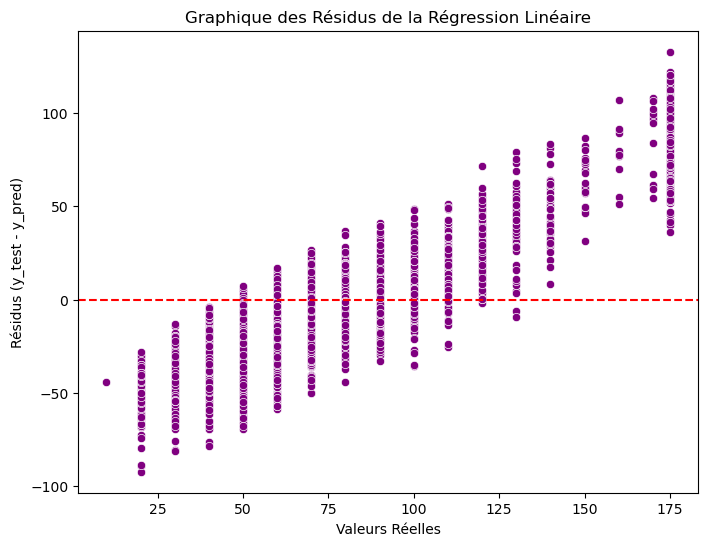

In [129]:
#Afficher le nuage de points et la droite de régression
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=(y_test - y_pred), color="purple")  
plt.axhline(0, linestyle='--', color='red') 
plt.xlabel("Valeurs Réelles")
plt.ylabel("Résidus (y_test - y_pred)")
plt.title("Graphique des Résidus de la Régression Linéaire")
plt.show()

<p style="background-color:#FAFAD2">
<b>Les résidus doivent être distribués de manière aléatoire autour de 0, sans tendance.
Ici, les résidus augmentent progressivement, ce qui suggère que le modèle n'explique pas bien certaines parties des données.</b>
</p>

<h2 style="color:green">3. Évaluer la performance (Calculer l'erreur quadratique)  :</h2>

In [132]:
# Définir fonction pour calculer l'erreur quadratique moyenne (MSE) 
def mean_squared_error(y_true, y_pred):
    n = len(y_true)  # Nombre d'observations
    mse = np.sum((y_true - y_pred) ** 2) / n
    return mse

In [133]:
# Calculer et afficher l erreur quadratique
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(" Évaluation du modèle :")
print(f" Mean Squared Error (MSE) : {mse:.2f}")
print(f" Mean Absolute Error (MAE) : {mae:.2f}")
print(f" R² Score : {r2:.4f}")

 Évaluation du modèle :
 Mean Squared Error (MSE) : 1559.59
 Mean Absolute Error (MAE) : 29.77
 R² Score : 0.1514


<p style="background-color:#FAFAD2">
Nous remarquons que l' erreur quadratique (MSE) est <b>très élevée</b>, donc nous aurons utiliser <b>La descente de gradient</b> pour l'optimisation qui ajuste les coefficients du modèle (poids W et biais b) pour minimiser l'erreur.
</p>

<h2 style="color:green">4. La descente de gradient  :</h2>

In [136]:
# Fonction de coût (MSE)
def compute_cost(X, y, W, b):
    m = len(y)
    y_pred = X.dot(W) + b
    error = y_pred - y
    cost = (1 / (2 * m)) * np.sum(error ** 2)  # Erreur quadratique moyenne
    return cost

# Fonction de descente de gradient
def gradient_descent(X, y, W, b, learning_rate, epochs):
    m = len(y)
    cost_history = []  # Pour stocker l'évolution du coût

    for i in range(epochs):
        y_pred = X.dot(W) + b
        error = y_pred - y
        
        # Calcul des gradients
        dW = (1 / m) * X.T.dot(error)
        db = (1 / m) * np.sum(error)
        
        # Mise à jour des paramètres
        W -= learning_rate * dW
        b -= learning_rate * db

        # Calcul du coût après mise à jour
        cost = compute_cost(X, y, W, b)
        cost_history.append(cost)

        # Affichage tous les 100 itérations
        if i % 100 == 0:
            print(f"Iteration {i}: Cost = {cost}")

    return W, b, cost_history

# Initialisation des paramètres
W_init = np.zeros(X_train.shape[1])  # Initialiser les poids à zéro
b_init = 0  # Initialiser le biais à zéro

# Hyperparamètres
epochs = 1000 # Nombre d'itérations
learning_rate = 0.01  # Taux d'apprentissage

# Exécution de la descente de gradient
W_final, b_final, cost_history = gradient_descent(X_train, y_train, W_init, b_init, learning_rate, epochs)

print("Poids optimisés :", W_final)
print("Biais optimisé :", b_final)


Iteration 0: Cost = 3974.9583966764635
Iteration 100: Cost = 1238.071258979593
Iteration 200: Cost = 861.01447796147
Iteration 300: Cost = 802.9983043424861
Iteration 400: Cost = 791.5066312421865
Iteration 500: Cost = 788.1191767997396
Iteration 600: Cost = 786.7450340461304
Iteration 700: Cost = 786.102198688576
Iteration 800: Cost = 785.787348415615
Iteration 900: Cost = 785.6311108034281
Poids optimisés : Composante 1    -1.233301
Composante 2     5.791839
Composante 3    -3.514758
Composante 4     4.797805
Composante 5    -0.570650
Composante 6    20.492664
dtype: float64
Biais optimisé : 79.0612832051123


<p style="background-color:#FAFAD2">
Au fil des itérations, le coût diminue fortement jusqu'à environ <b>785</b>, ce qui indique que <b>l'algorithme apprend bien</b>.
Après <b>600 itérations</b>, le coût se stabilise autour de <b>785</b>, ce qui signifie que <b>la descente de gradient a convergé</b>.<br>
Donc, on peut dire que L'algorithme a bien appris les paramètres optimaux.
Le coût final est <b>785</b>, ce qui est nettement inférieur au coût initial, donc <b>le modèle est bien optimisé</b>.
</p>

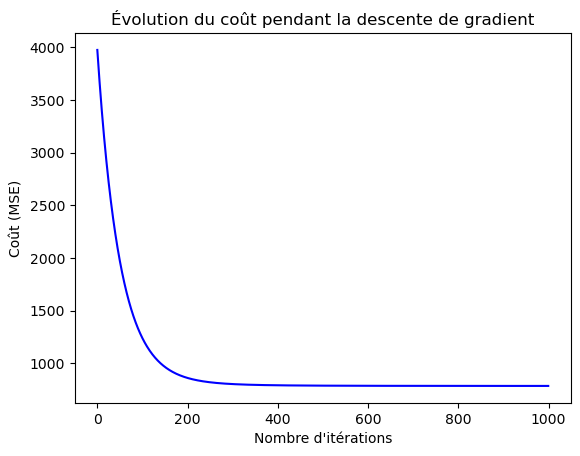

In [138]:
# Visualiser l'evolution de l erreur
plt.plot(range(len(cost_history)), cost_history, color="blue")
plt.xlabel("Nombre d'itérations")
plt.ylabel("Coût (MSE)")
plt.title("Évolution du coût pendant la descente de gradient")
plt.show()

<h2 style="color:green">5. Prédiction  avec le modèle appris  :</h2>

In [140]:
y_pred = X_test.dot(W_final) + b_final

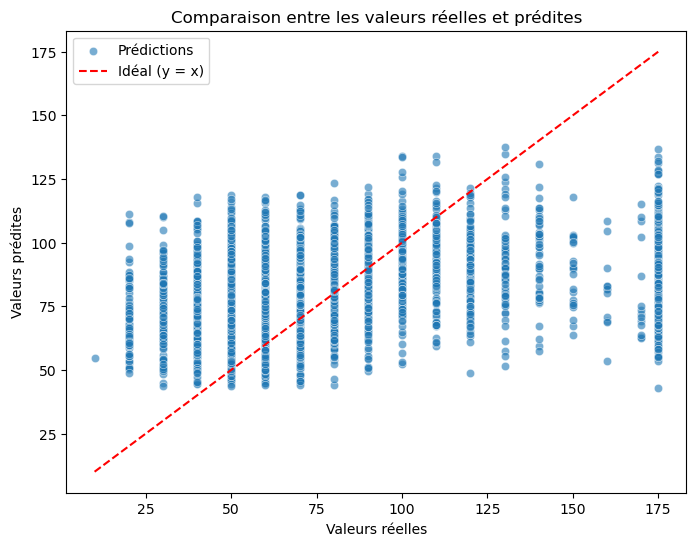

In [141]:
# Visualiser les resultats
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.6, label="Prédictions")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Idéal (y = x)")
plt.xlabel("Valeurs réelles")
plt.ylabel("Valeurs prédites")
plt.title("Comparaison entre les valeurs réelles et prédites")
plt.legend()
plt.show()

<p style="background-color:#FAFAD2">
D'après ce graphique qui compare les valeurs réelles et les valeurs prédites par un modèle de régression linéaire, on observe un fort écart entre les valeurs prédites et les valeurs réelles. Cela suggère que la régression linéaire ne capte pas correctement les tendances complexes des données donc ne peut pas bien les modéliser.<br>
Donc, dans ce cas nous doivons utiliser un modèle plus perfermant, comme <b>XGBoost</b>, puisqu'est un modèle de <b>boosting basé</b> sur les arbres de décision, ce qui lui permet de mieux s’adapter aux relations complexes dans les données, d'où Le passage à <b>XGBoost</b> permet d’obtenir une meilleure précision et des prédictions plus fiables.
</p>

<h2 style="color:green">6. Prédiction  avec le modèle RandomForestRegressor  :</h2>

In [144]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# Initialisation du modèle avec des hyperparamètres de base
rf_model = RandomForestRegressor(
    n_estimators=200,    # Nombre d'arbres dans la forêt
    max_depth=80,        # Profondeur maximale des arbres
    random_state=42,     # Reproductibilité des résultats
)

# Entraînement du modèle sur les données d'entraînement
rf_model.fit(X_train, y_train)

# Prédiction sur l'ensemble de test
y_pred_rf = rf_model.predict(X_test)


In [145]:
# Calcul des erreurs
mse_rf = mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

# Affichage des résultats
print(" Évaluation du modèle RandomForest :")
print(f" Mean Squared Error (MSE) : {mse_rf:.2f}")
print(f" Mean Absolute Error (MAE) : {mae_rf:.2f}")
print(f" R² Score : {r2_rf:.4f}")


 Évaluation du modèle RandomForest :
 Mean Squared Error (MSE) : 615.31
 Mean Absolute Error (MAE) : 16.47
 R² Score : 0.6652


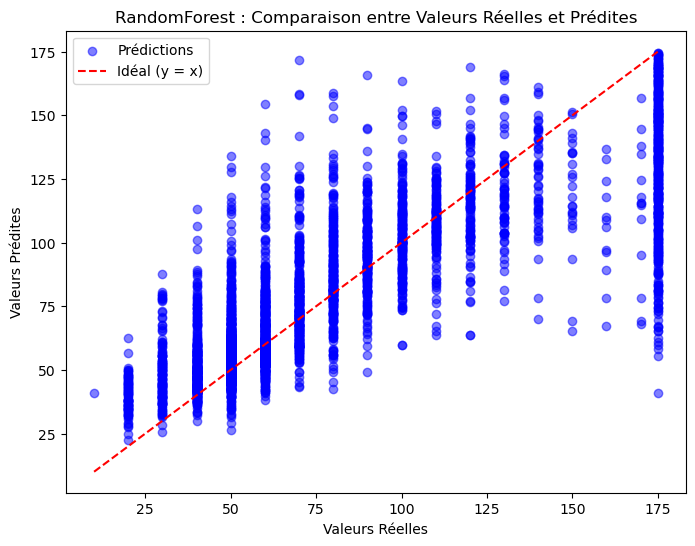

In [146]:
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_rf, color="blue", alpha=0.5, label="Prédictions")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color="red", linestyle="--", label="Idéal (y = x)")
plt.xlabel("Valeurs Réelles")
plt.ylabel("Valeurs Prédites")
plt.title("RandomForest : Comparaison entre Valeurs Réelles et Prédites")
plt.legend()
plt.show()


<h2 style="color:green">7. Prédiction  avec le modèle XGBOOST  :</h2>

In [148]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [149]:
# Initialisation et entraînement du modèle XGBoost
xgb_model = xgb.XGBRegressor(
    n_estimators=200,    # Nombre d'arbres
    max_depth=80,         # Profondeur maximale de chaque arbre
    learning_rate=0.1,
    random_state=42
)
xgb_model.fit(X_train, y_train)

# Prédiction sur l'ensemble de test
y_pred_xgb = xgb_model.predict(X_test)

In [150]:
# Calcul des métriques d'évaluation
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print("Évaluation du modèle XGBoost :")
print(f"Mean Squared Error (MSE) : {mse_xgb:.2f}")
print(f"Mean Absolute Error (MAE) : {mae_xgb:.2f}")
print(f"R² Score : {r2_xgb:.4f}")

Évaluation du modèle XGBoost :
Mean Squared Error (MSE) : 671.94
Mean Absolute Error (MAE) : 16.19
R² Score : 0.6344


<p style="background-color:#FAFAD2">
D'après le calcul des métrique, nous remarquons que le<b> MSE et le MAE</b> sont <b>plus faibles</b> par rapport au autres modèles qui déja testées, avec un <b>Score R moyen explique ~67.68% </b>de la variance des données. <br>
Donc le modèle <b>XGBoost</b> a bien capturé les interactions complexes entre les variables mieux que la <b>Régression Linéaire</b>.
</p>

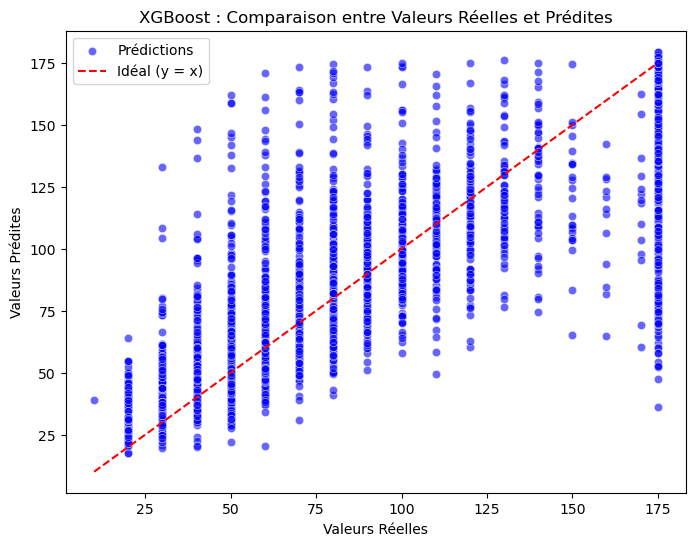

In [152]:
# Visualisation des résultats
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred_xgb, alpha=0.6, label="Prédictions", color="blue")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label="Idéal (y = x)")
plt.xlabel("Valeurs Réelles")
plt.ylabel("Valeurs Prédites")
plt.title("XGBoost : Comparaison entre Valeurs Réelles et Prédites")
plt.legend()
plt.show()

<h2 style="color:green">8. Prédiction  avec le modèle ExtraTreesRegressor  :</h2>

In [154]:
# Initialisation du modèle ExtraTreesRegressor
extra_trees_model = ExtraTreesRegressor(
    n_estimators=200,  # Nombre d'arbres
    max_depth=100,      # Profondeur maximale des arbres
    random_state=42
)

# Entraînement du modèle sur les données
extra_trees_model.fit(X_train, y_train)

# Prédiction sur l’ensemble de test
y_pred_et = extra_trees_model.predict(X_test)


In [155]:
# Calcul des métriques d'évaluation
mse = mean_squared_error(y_test, y_pred_et)
mae = mean_absolute_error(y_test, y_pred_et)
r2 = r2_score(y_test, y_pred_et)

# Affichage des résultats
print(f"Évaluation du modèle ExtraTreesRegressor :")
print(f"Mean Squared Error (MSE) : {mse:.2f}")
print(f"Mean Absolute Error (MAE) : {mae:.2f}")
print(f"R² Score : {r2:.4f}")


Évaluation du modèle ExtraTreesRegressor :
Mean Squared Error (MSE) : 510.05
Mean Absolute Error (MAE) : 14.80
R² Score : 0.7225


<p style="background-color:#FAFAD2">
Comparé à <b>XGBoost</b>, <b>ExtraTrees</b> semble mieux s’adapter aux données. Cela peut être dû à sa nature plus robuste face au bruit et à son utilisation d’un bootstraping plus aléatoire, qui peut améliorer la généralisation.
Cependant, <b>0.72</b> n’est pas encore parfait, ce qui signifie qu’il reste <b>28 %</b> de variance non expliquée.<br>
<b>Donc ExtraTreesRegressor améliore la prédiction par rapport à XGBoost, mais il y a encore une marge d’amélioration. </b>
</p>

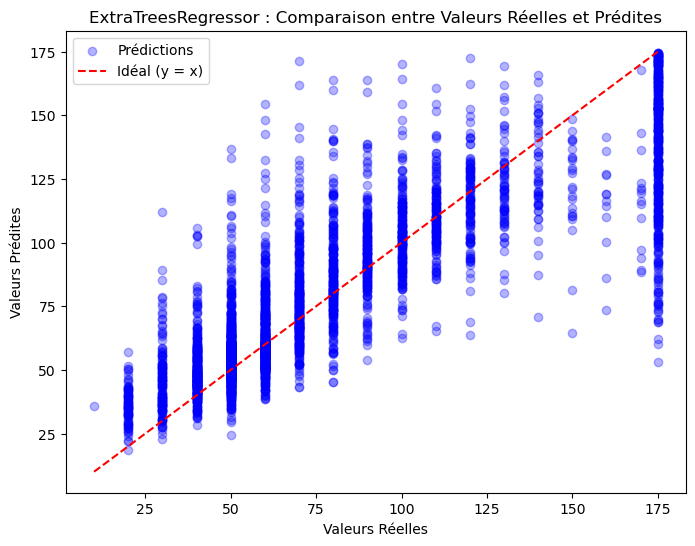

In [157]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_et, color='blue', alpha=0.3, label="Prédictions")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='dashed', label="Idéal (y = x)")
plt.xlabel("Valeurs Réelles")
plt.ylabel("Valeurs Prédites")
plt.title("ExtraTreesRegressor : Comparaison entre Valeurs Réelles et Prédites")
plt.legend()
plt.show()


<h2 style="color:#B22222">Conclusion :</h2>
<p style="background-color: #FFF8DC">
<b>La régression est une technique essentielle pour modéliser et prédire des variables continues, mais son efficacité dépend du choix du modèle. La régression linéaire, bien qu'intuitive, ne capture pas les relations complexes, ce qui justifie l'utilisation de modèles avancés comme XGBoost et ExtraTreesRegressor, qui améliore significativement la précision des prédictions. Cependant, malgré une meilleure performance (R² = 0.7225), des erreurs persistent, notamment sur certaines valeurs extrêmes.<br>
En résumé, il faut continuer à expérimenter et analyser les résultats pour obtenir une meilleure généralisation et réduire les erreurs de prédiction.</b>
</p>